In [ ]:
import uproot
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as LogNorm
import matplotlib.ticker as ticker
import math
import warnings
#from lmfit import Model
from scipy.optimize import curve_fit, least_squares, OptimizeWarning
from scipy.stats import chisquare

from scipy.odr import ODR, Model, RealData
import ROOT


In [178]:
tfile_hist = [f"../histograms/rga/theta_phi_{i}.root" for i in [10.2] ]
tfile_func = [f'../data/acceptance_map/acceptanceMap_{i}_low_bin.root' for i in [10.2, 10.4, 10.6] ]
par_list = ['e', 'pip', 'pim']
par_title = ['e', r'$\pi^+$', r'$\pi^-$']
hBase = 'hThetaPhi_sec'
fBase = 'fThetaPhi_sec'
vBase = 'fitBounds_sec'

P_REBIN = 2  # number of consecutive p bins to merge; 1 = no rebinning


In [179]:
phi_avg = 0
side = 1
parIdx = 0

theta_min_fixed = 0

def trapezoid(x, x0, x1, x2, x3, height):
    return np.piecewise(
        x,
        [x < x0,
         (x >= x0) & (x < x1),
         (x >= x1) & (x < x2),
         (x >= x2) & (x <= x3),
         x > x3],
        [0,
         lambda x: ((x - x0) / (x1 - x0)) * height,
         height,
         lambda x: ((x3 - x) / (x3 - x2)) * height,
         0]
    )

def expo(x, a, b, c, d):
  
    return a*np.exp(b*x+c)+d
def power(x, a, b, c):
    return a + b*x**c

def poly3(x, a, b, c, d):

    return a + b*x + c*x**2 + d*x**3
def rFunc(x, a, b, c):
    return a + b/(x-c)

def getPercentile( arr, nBins, perc ):
    for i in range(nBins):
        if np.sum(arr[:i])/np.sum(arr) > 0.01*perc:
            return i
    return 0

def lorGauss(x, mu, sig1, sig2, A, cutoff):
    switchOver = A/(np.pi)*((sig2)/((cutoff-mu)**2 + sig2**2))
    return np.piecewise(
        x,
        [x < cutoff - switchOver/sig1,
            (x >= cutoff - switchOver/sig1) & (x < cutoff),
         x >= cutoff],
        [
         0,
         lambda x: sig1*(x-cutoff) + switchOver,#lambda x: A*np.exp(-(x - mu)**2 / (2 * sig1**2)),
         lambda x: A/(np.pi)*((sig2)/((x-mu)**2 + sig2**2))
        ]
    )
    

def linGauss(x, mu, sig1, sig2, A, cutoff):
    
    switchOver = A*np.exp(-(cutoff - mu)**2 / (2 * sig2**2))

    return np.piecewise(
        x,
        [x < cutoff - switchOver/sig1,
            (x >= cutoff - switchOver/sig1) & (x < cutoff),
         x >= cutoff],
        [
         0,
         lambda x: sig1*(x-cutoff) + switchOver,#lambda x: A*np.exp(-(x - mu)**2 / (2 * sig1**2)),
         lambda x: A*np.exp(-(x - mu)**2 / (2 * sig2**2))
        ]
    )

def returnXint(mu, sig1, sig2, A, cutoff):
    return cutoff - A*np.exp(-(cutoff - mu)**2 / (2 * sig2**2))/sig1

def doubleGauss(x, mu, sig1, sig2, A, cutoff):
    
    return np.piecewise(
        x,
        [x < mu,
            x >= mu
        ],
        [
         lambda x: A*np.exp(-(x - mu)**2 / (2 * sig1**2)),
         lambda x: A*np.exp(-(x - mu)**2 / (2 * sig2**2))
        ]
    )

def phiFunction_map(x, a, b, c, phi_avg, parIdx, side, max):
    
    #exponent = 1 if parIdx in [0,2] else 1/2
    #denominator = (x - b)/c + 1 if parIdx in [0,2] else np.exp((x - b)/c) + 1
    return np.piecewise(

        x,
        [x < b,
         (x >= b) & (x < max),
         x>max],
        [lambda x: np.full_like(x, phi_avg),
         lambda x: phi_avg + (side)*a*(1 - 1/( abs((x - b)/c) + 1 if parIdx in [0,2] else np.exp(abs((x - b)/c)) + 1)),
         lambda x: np.full_like(x, phi_avg)]
    )
def phiFunction_fixed(x, a, c):
    
    denominator = abs((x - theta_min_fixed)/c) + 1 if parIdx in [0,2] else np.exp(abs((x - theta_min_fixed)/c)) + 1
    #exponent = 1 if parIdx in [0,2] else 1/2
    return np.piecewise(

        x,
        [x < theta_min_fixed,
         x >= theta_min_fixed],
        [lambda x: np.full_like(x, phi_avg),
         lambda x:  phi_avg + (side)*a*(1 - 1/( denominator + 1))]
    )

def model_phi(B,x):
    exponent = 1 if parIdx in [0] else 1/2
    return np.piecewise(

        x,
        [x < B[1],
         x >= B[1]],
        [lambda x: np.full_like(x, phi_avg),
         lambda x:  phi_avg + (side)*B[0]*(1 - 1/( (x - B[1])**(exponent)/B[2] + 1))]
    )
model = Model(model_phi)
def fitFunction(pIdx):
    if pIdx == 0:
        return doubleGauss
    else:
        return linGauss


In [180]:
def load_hist_values(p, sec, par):
    """Load and sum theta-phi histogram over all tfile_hist files and P_REBIN consecutive p bins.

    Parameters
    ----------
    p   : int   Starting momentum bin index.
    sec : int   Detector sector (0-5).
    par : str   Particle label ('e', 'pip', 'pim').

    Returns
    -------
    values  : 2-D ndarray  Summed bin contents  (phi × theta).
    xEdges  : 1-D ndarray  Phi  bin centres.
    yEdges  : 1-D ndarray  Theta bin centres.
    """
    hists = [
        uproot.open(f)[hBase + f'_{sec}_bin_{p + dp}_{par};1']
        for dp in range(P_REBIN)
        for f in tfile_hist
    ]
    values = np.sum([h.values() for h in hists], axis=0)
    return values, hists[0].axis(0).centers(), hists[0].axis(1).centers()


In [ ]:
t_range = np.linspace( 5, 45, 180)

PLATEAU_FRAC_CUT = 0.75

def plot_phi(parIdx, p, sec, max_theta):
    par  = par_list[parIdx]

    params = []
    p_errs = []
    yVals  = []

    values, xEdges, yEdges = load_hist_values(p, sec, par)

    for theta in range(values.shape[1]):
        if yEdges[theta] > max_theta:
            continue
        col = values[:, theta]
        if col.sum() <= 50:
            continue

        gtz = np.where(col > 0)[0]
        pv  = np.where(col > 0.65 * col.max())[0]

        total_width = xEdges[gtz[-1]] - xEdges[gtz[0]]
        plateau_fraction = (xEdges[pv[-1]] - xEdges[pv[0]]) / total_width if total_width > 0 else 0
        if plateau_fraction < PLATEAU_FRAC_CUT:
            continue

        p0 = [
            xEdges[gtz[0]],
            0.5 * (xEdges[gtz[0]]  + xEdges[pv[0]]),
            0.5 * (xEdges[pv[-1]]  + xEdges[gtz[-1]]),
            xEdges[gtz[-1]],
            0.75 * col.max(),
        ]
        bounds_trap = (
            [xEdges[gtz[0]] - 5, xEdges[gtz[0]],   xEdges[pv[0]],   xEdges[pv[-1]],   0           ],
            [xEdges[pv[0]],      xEdges[pv[-1]],    xEdges[gtz[-1]], xEdges[-1] + 5,   col.max()*2 ]
        )

        try:
            with warnings.catch_warnings():
                warnings.filterwarnings("error", category=OptimizeWarning)
                popt, pcov = curve_fit(trapezoid, xEdges, col, p0, bounds=bounds_trap)
        except (RuntimeError, OptimizeWarning):
            continue

        if popt[0] > popt[1] or popt[1] > popt[2] or popt[2] > popt[3]:
            continue
        if popt[0] < xEdges[gtz[0]] or popt[3] > xEdges[gtz[-1]]:
            continue

        perr = np.sqrt(np.diag(pcov))
        params.append(list(popt[:4]))
        p_errs.append(list(perr[:4]))
        yVals.append(yEdges[theta])

    return np.asarray(params), np.asarray(p_errs), np.asarray(yVals)


In [182]:
def get_plateau_fractions(parIdx, p, sec, max_theta):
    """Return plateau_fraction = plateau_width / total_width for each theta slice with >50 counts."""
    par = par_list[parIdx]
    values, xEdges, yEdges = load_hist_values(p, sec, par)

    fracs  = []
    thetas = []
    for theta in range(values.shape[1]):
        if yEdges[theta] > max_theta:
            continue
        col = values[:, theta]
        if col.sum() <= 50:
            continue
        gtz = np.where(col > 0)[0]
        pv  = np.where(col > 0.65 * col.max())[0]
        total_width = xEdges[gtz[-1]] - xEdges[gtz[0]]
        frac = (xEdges[pv[-1]] - xEdges[pv[0]]) / total_width if total_width > 0 else 0
        fracs.append(frac)
        thetas.append(yEdges[theta])
    return np.array(fracs), np.array(thetas)


In [183]:
def plot_fit(parIdx, p, sec, ax):
    par   = par_list[parIdx]
    p_max = 8 if parIdx == 0 else 5
    p_min = 3 if parIdx == 0 else 0
    dp    = (p_max - p_min) / 40.

    ax.set_title(rf"{par_title[parIdx]}, {p*dp + p_min:.2f} < $p$ < {(p + P_REBIN)*dp + p_min:.2f} [GeV]")
    ax.set_ylabel(r"$\phi$ [deg]", fontsize=16)
    ax.set_xlabel(r"$\theta$ [deg]", fontsize=16)

    values, xEdges, yEdges = load_hist_values(p, sec, par)
    values = values.astype(float)
    values[values == 0] = np.nan

    ax.pcolormesh(yEdges, xEdges, np.transpose(values.T), cmap='viridis', shading='nearest')


In [184]:
def getHistMean(parIdx, p, sec):
    par = par_list[parIdx]
    bin_contents, x_centers, y_centers = load_hist_values(p, sec, par)

    values_theta = np.sum(bin_contents, axis=0)
    bound_ind = getPercentile(values_theta, 270, 99)
    max_theta = y_centers[bound_ind]

    total_entries = np.sum(bin_contents)

    if total_entries == 0:
        print("The histogram is empty.")
    else:
        sum_x = np.sum(x_centers * np.sum(bin_contents, axis=1))
        mean_x = sum_x / total_entries

        sum_y = np.sum(y_centers * np.sum(bin_contents, axis=0))
        mean_y = sum_y / total_entries

        return mean_y, mean_x, max_theta


In [ ]:

phi_range = np.linspace(0, 45, 500)
cut_0 = [25, 10, 24]

def plot_theta(parIdx, p, sec):
    par = par_list[parIdx]

    low     = []
    low_err = []
    xVals   = []

    values, xEdges, yEdges = load_hist_values(p, sec, par)

    for phi in range(500):
        if np.sum(values[phi]) <= 50:
            continue

        max_theta_idx     = np.where(values[phi] > .9  * np.max(values[phi]))
        max_theta_idx_cut = np.where(values[phi] > 0.8 * np.max(values[phi]))

        mu_est  = yEdges[max_theta_idx[0][0]]
        std_dev = max(np.sqrt(np.average((yEdges - mu_est)**2, weights=values[phi])), 0.5)
        p0  = [mu_est, 0.5*std_dev, std_dev, np.max(values[phi]), cut_0[parIdx]]
        gtz = np.where(values[phi, :] > 0)[0]

        try:
            with warnings.catch_warnings():
                warnings.filterwarnings("error", category=OptimizeWarning)
                popt, pcov = curve_fit(doubleGauss, yEdges, values[phi], p0=p0)
        except (RuntimeError, OptimizeWarning):
            continue

        if parIdx > 0:
            std_dev_lin = np.sqrt(np.average((yEdges - np.average(yEdges, weights=values[phi]))**2,
                                             weights=values[phi]))
            p0 = [mu_est, 200, std_dev_lin, np.max(values[phi]),
                  yEdges[max_theta_idx_cut[0][0]]]
            try:
                with warnings.catch_warnings():
                    warnings.filterwarnings("error", category=OptimizeWarning)
                    popt, pcov = curve_fit(linGauss, yEdges, values[phi], p0=p0)
            except (RuntimeError, OptimizeWarning):
                continue

        if parIdx > 0 and popt[4] < yEdges[gtz[0]] - 5:
            continue
        if parIdx == 0 and popt[0] < yEdges[gtz[0]]:
            continue

        perr = np.sqrt(np.diag(pcov))
        if parIdx > 0:
            low.append(popt[4])
            low_err.append(perr[4])
        else:
            low.append(popt[0])
            low_err.append(perr[1])
        xVals.append(xEdges[phi])

    return np.asarray(low), np.asarray(low_err), np.asarray(xVals)


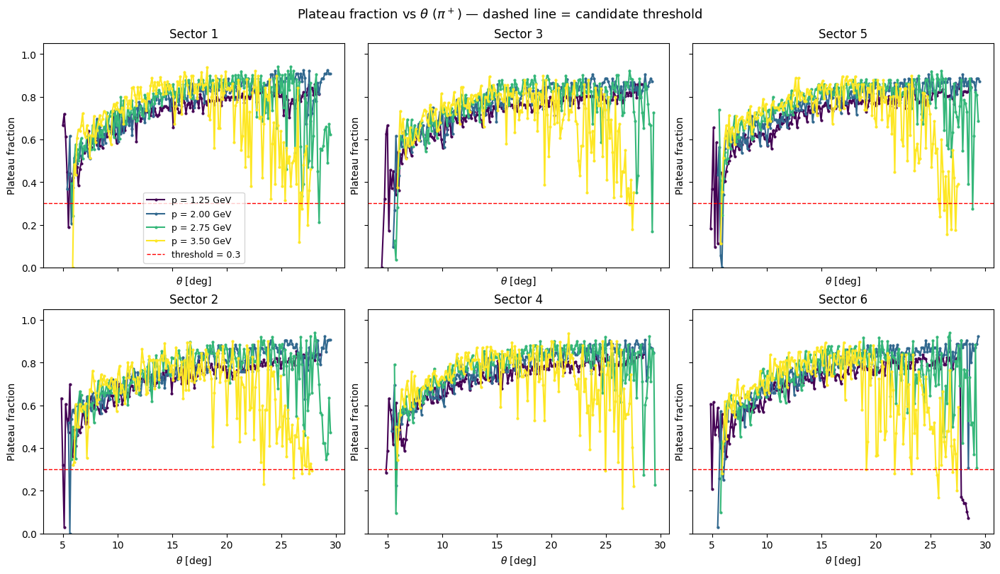

In [186]:
# --- Plateau fraction diagnostic ---
# Shows plateau_fraction = plateau_width/total_width vs theta for several momentum bins.
# Use this to calibrate the threshold separating plot_phi (wide plateau) from plot_theta (peaked).

parIdx  = 1  # 0=e, 1=pi+, 2=pi-
p_bins  = [10, 16, 22, 28]
p_max   = 8 if parIdx == 0 else 5
p_min   = 3 if parIdx == 0 else 0
colors  = plt.cm.viridis(np.linspace(0, 1, len(p_bins)))

fig, ax = plt.subplots(2, 3, figsize=(14, 8), layout='constrained', sharex=True, sharey=True)
for sec in range(6):
    axi = ax[sec % 2, sec // 2]
    for color, p in zip(colors, p_bins):
        _, _, max_theta   = getHistMean(parIdx, p, sec)
        fracs, thetas     = get_plateau_fractions(parIdx, p, sec, max_theta)
        p_val             = p * (p_max - p_min) / 40 + p_min
        axi.plot(thetas, fracs, marker='o', ms=2, linestyle='-', color=color, label=f'p = {p_val:.2f} GeV')
    axi.axhline(0.3, color='red', linestyle='--', lw=1, label='threshold = 0.3')
    axi.set_title(f'Sector {sec + 1}')
    axi.set_ylim(0, 1.05)
    axi.set_xlabel(r'$\theta$ [deg]')
    axi.set_ylabel('Plateau fraction')

ax[0, 0].legend(fontsize=9)
fig.suptitle(rf'Plateau fraction vs $\theta$ ({par_title[parIdx]}) — dashed line = candidate threshold', fontsize=13)
plt.show()


In [ ]:
def doAnalysis(parIdx):

    i = parIdx
    side = 1
    phi_avg = 0
    theta_min_fixed = 0

    def phiFunction(x, a, b, c):
        denominator = (x - b)/c + 1 if parIdx in [0,2] else np.exp((x - b)/c) + 1
        return np.piecewise(
            x,
            [x < b, x >= b],
            [lambda x: np.full_like(x, phi_avg),
             lambda x: phi_avg + (side)*a*(1 - 1/(abs(((x - b)/c) + 1 if parIdx in [0,2] else np.exp(abs((x - b)/c)) + 1)))]
        )

    def phiFunction_fixed(x, a, c):
        return np.piecewise(
            x,
            [x < theta_min_fixed, x >= theta_min_fixed],
            [lambda x: np.full_like(x, phi_avg),
             lambda x: phi_avg + (side)*a*(1 - 1/((abs((x - theta_min_fixed)/c) + 1 if parIdx in [0,2] else np.exp(abs((x - theta_min_fixed)/c)) + 1)))]
        )

    params_l1 = [[] for _ in range(6)]
    params_l2 = [[] for _ in range(6)]
    params_l3 = [[] for _ in range(6)]
    params_u1 = [[] for _ in range(6)]
    params_u2 = [[] for _ in range(6)]

    errs_l1 = [[] for _ in range(6)]
    errs_l2 = [[] for _ in range(6)]
    errs_l3 = [[] for _ in range(6)]
    errs_u1 = [[] for _ in range(6)]
    errs_u2 = [[] for _ in range(6)]

    p_low  = 0 if i == 0 else 8
    p_high = 34 if i == 0 else 40
    Range  = range(p_low, p_high, P_REBIN) if i == 0 else reversed(range(p_low, p_high, P_REBIN))
    sector_p0 = {}  # per-sector warm-start: persists across p bins

    for p in Range:
        fig, ax = plt.subplots(1, 2, figsize=(10, 12), layout='constrained')

        for sector in [0, 1, 2, 3, 4, 5]:
            pan = 0 if sector in [1, 2, 3] else 1
            _, x_mean, max_theta = getHistMean(i, p, sector)

            low, low_err, xVals = plot_theta(i, p, sector)

            if parIdx != 0:
                params, perr, yVals = plot_phi(i, p, sector, max_theta)
                params = np.asarray(params)

            plot_fit(i, p, sector, ax[pan])

            low_val = np.min(low) if np.min(low) > 0 else 10

            ax[0].set_xlim(low_val - 10, 55)
            ax[1].set_xlim(low_val - 10, 55)
            ax[0].set_ylim(-20, 250)
            ax[1].set_ylim(-200, 60)

            phi_avg = x_mean

            low_mask  = (xVals < x_mean)
            high_mask = (xVals >= x_mean)

            low_vals   = low[low_mask]
            high_vals  = low[high_mask]
            xVals_low  = xVals[low_mask]
            xVals_high = xVals[high_mask]

            if parIdx != 0:
                ax[pan].plot(yVals, params[:, 1], color='cyan', ms=1, marker='o', linestyle=' ')
                ax[pan].plot(yVals, params[:, 2], color='cyan', ms=1, marker='o', linestyle=' ')

                low_vals   = np.append(low_vals,  yVals[(params[:, 1] < x_mean) & (yVals > np.min(low_vals))])
                xVals_low  = np.append(xVals_low, params[:, 1][(params[:, 1] < x_mean) & (yVals > np.min(low_vals))])

                high_vals  = np.append(high_vals,  yVals[(params[:, 2] > x_mean) & (yVals > np.min(high_vals))])
                xVals_high = np.append(xVals_high, params[:, 2][(params[:, 2] > x_mean) & (yVals > np.min(high_vals))])

            ax[pan].plot(low, xVals, marker='+', ms=1, linestyle=' ', color='cyan')

            if sector not in sector_p0:
                p0 = [float(np.max(xVals_low) - np.min(xVals_low)),
                      float(low_val + 0.5 * (np.max(low_vals) - low_val)),
                      1.5]
            else:
                p0 = list(sector_p0[sector])

            side = -1

            bounds = ([-np.inf, low_val, 0], [np.inf, np.inf, np.inf])
            if p0[1] < low_val:
                p0[1] = low_val + .05
            popt_up, pcov_up = curve_fit(phiFunction, low_vals, xVals_low, nan_policy='omit', p0=p0, bounds=bounds)
            perr_up = np.sqrt(np.diag(pcov_up))
            p0 = popt_up
            if p0[1] < low_val:
                p0[1] = low_val + .05

            side = 1
            popt_low, pcov_low = curve_fit(phiFunction, high_vals, xVals_high, nan_policy='omit', p0=p0, bounds=bounds)
            perr_low = np.sqrt(np.diag(pcov_low))

            sector_p0[sector] = list(popt_low)
            theta_min_fixed = (popt_low[1] + popt_up[1]) / 2
            theta_min_err   = 0.5 * np.sqrt(perr_up[1]**2 + perr_low[1]**2)

            p0_2 = [(popt_up[j] + popt_low[j]) / 2 for j in [0, 2]]

            side = -1
            popt_up, pcov_up = curve_fit(phiFunction_fixed, low_vals, xVals_low, nan_policy='omit', p0=p0_2)
            side = 1
            popt_low, pcov_up = curve_fit(phiFunction_fixed, high_vals, xVals_high, nan_policy='omit', p0=p0_2)

            side = -1
            ax[pan].plot(phi_range, phiFunction_fixed(phi_range, *popt_up), color='red')
            side = 1
            ax[pan].plot(phi_range, phiFunction_fixed(phi_range, *popt_low), color='red')

            perr_low = np.sqrt(np.diag(pcov_low))
            perr_up  = np.sqrt(np.diag(pcov_up))

            insIdx = 0 if parIdx > 0 else np.size(params_l1[sector])

            params_l1[sector].insert(insIdx, popt_low[0])
            params_l2[sector].insert(insIdx, popt_low[1])
            params_l3[sector].insert(insIdx, theta_min_fixed)
            params_u1[sector].insert(insIdx, popt_up[0])
            params_u2[sector].insert(insIdx, popt_up[1])

            errs_l1[sector].insert(insIdx, perr_low[0])
            errs_l2[sector].insert(insIdx, perr_low[1])
            errs_l3[sector].insert(insIdx, theta_min_err)
            errs_u1[sector].insert(insIdx, perr_up[0])
            errs_u2[sector].insert(insIdx, perr_up[1])

    return params_l1, params_l2, params_l3, params_u1, params_u2, errs_l1, errs_l2, errs_l3, errs_u1, errs_u2


/var/folders/4d/9x90517x6q3cc4_sz1jrqlj00000gn/T/ipykernel_94109/3307292032.py:23: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, pcov = curve_fit(doubleGauss, yEdges, values[phi], p0=p0)


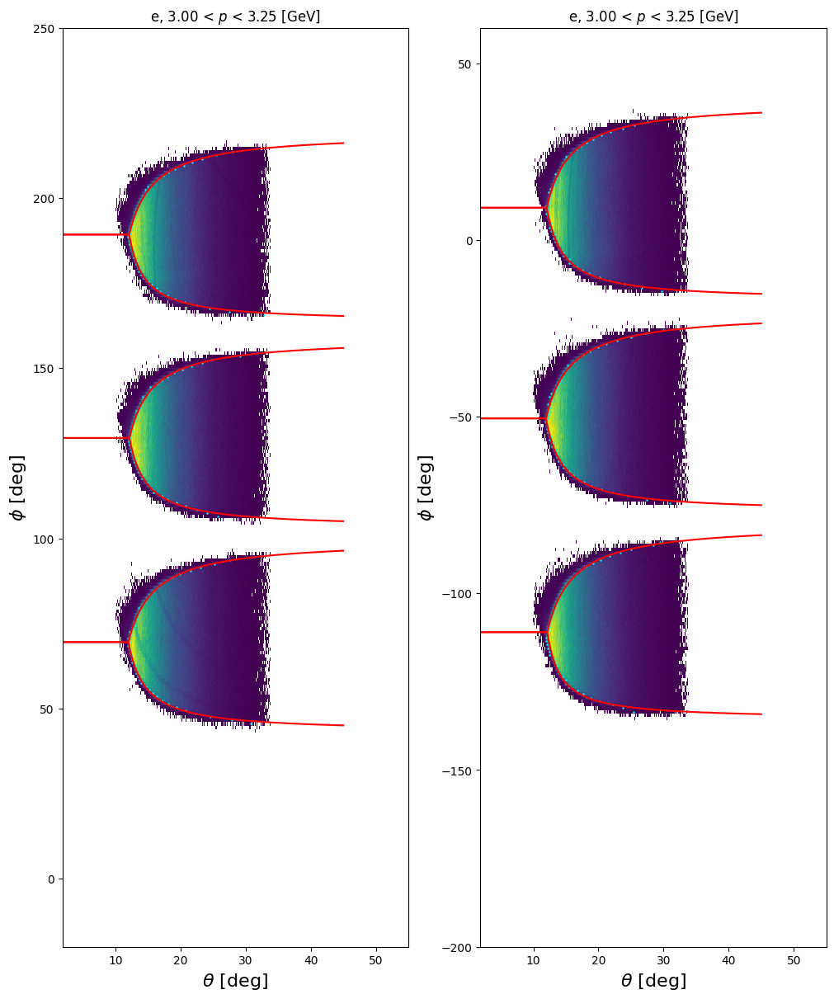

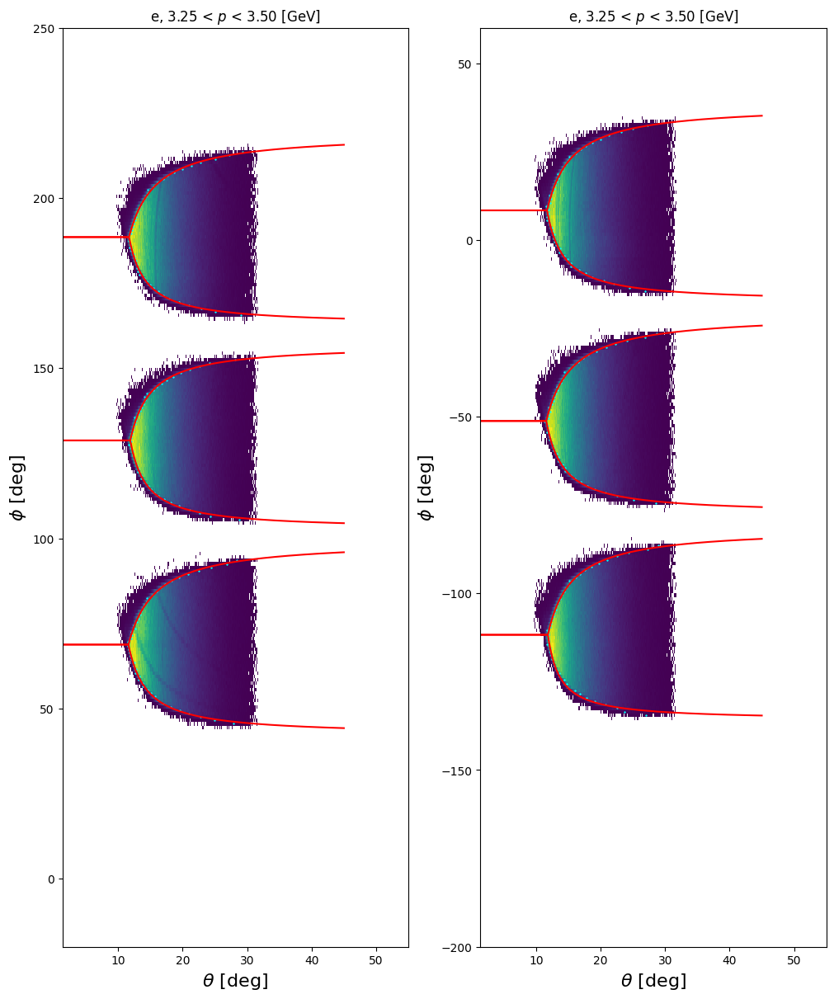

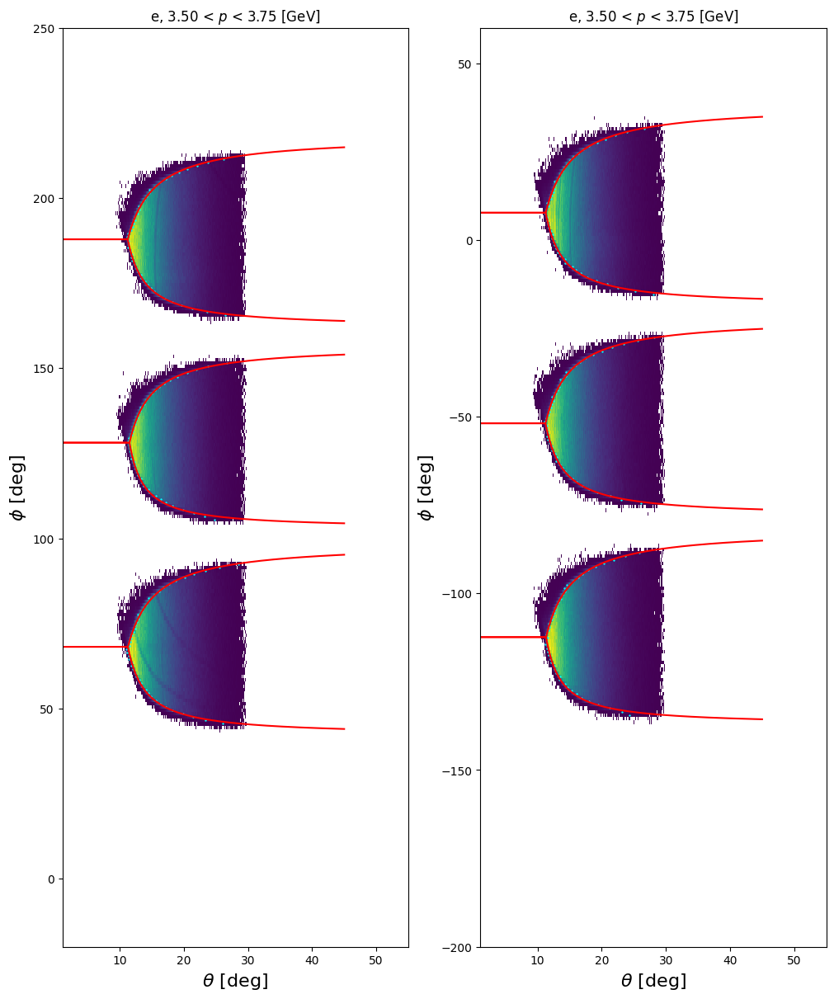

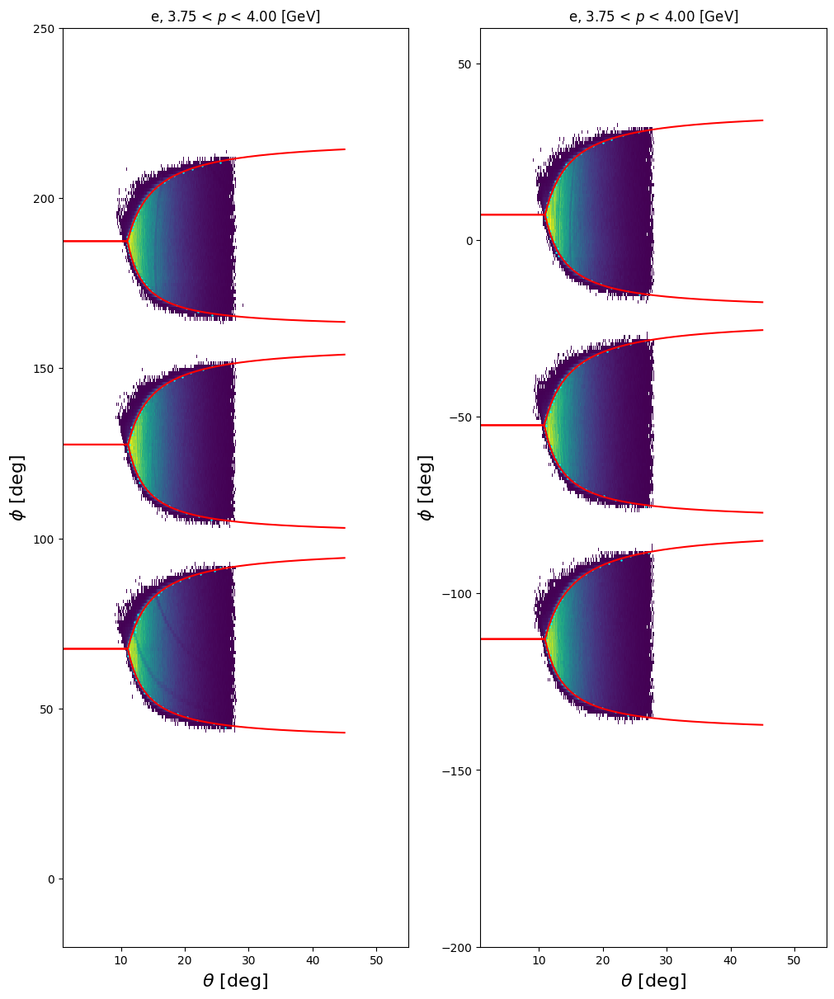

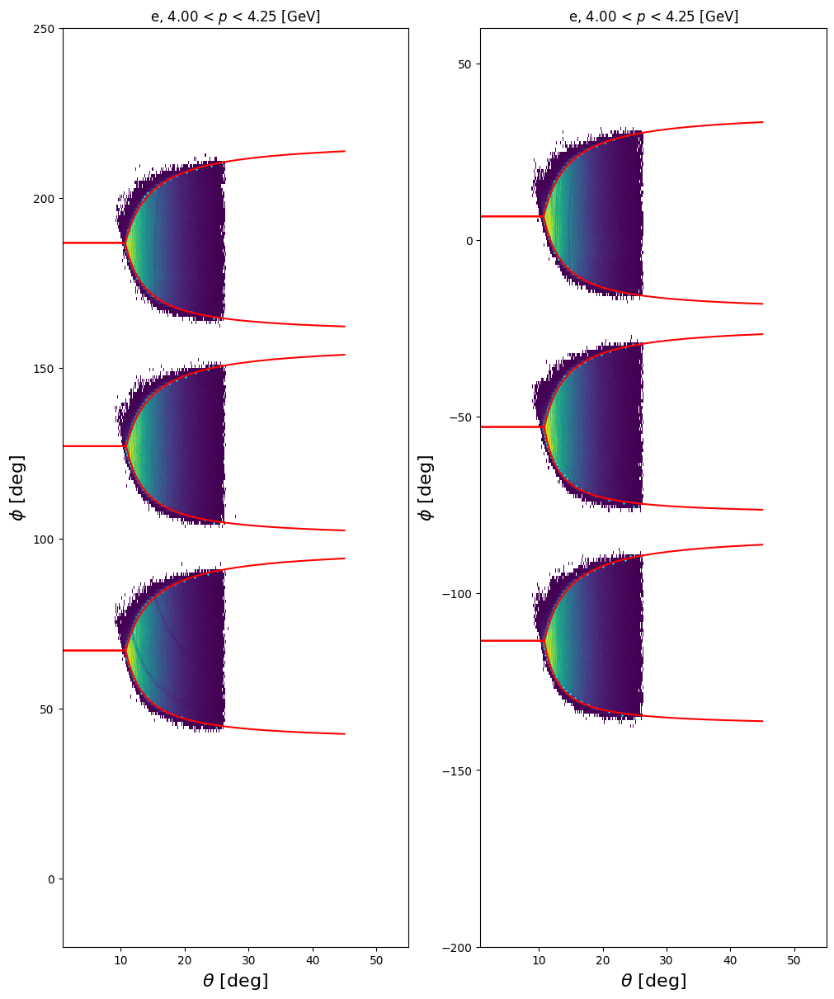

...

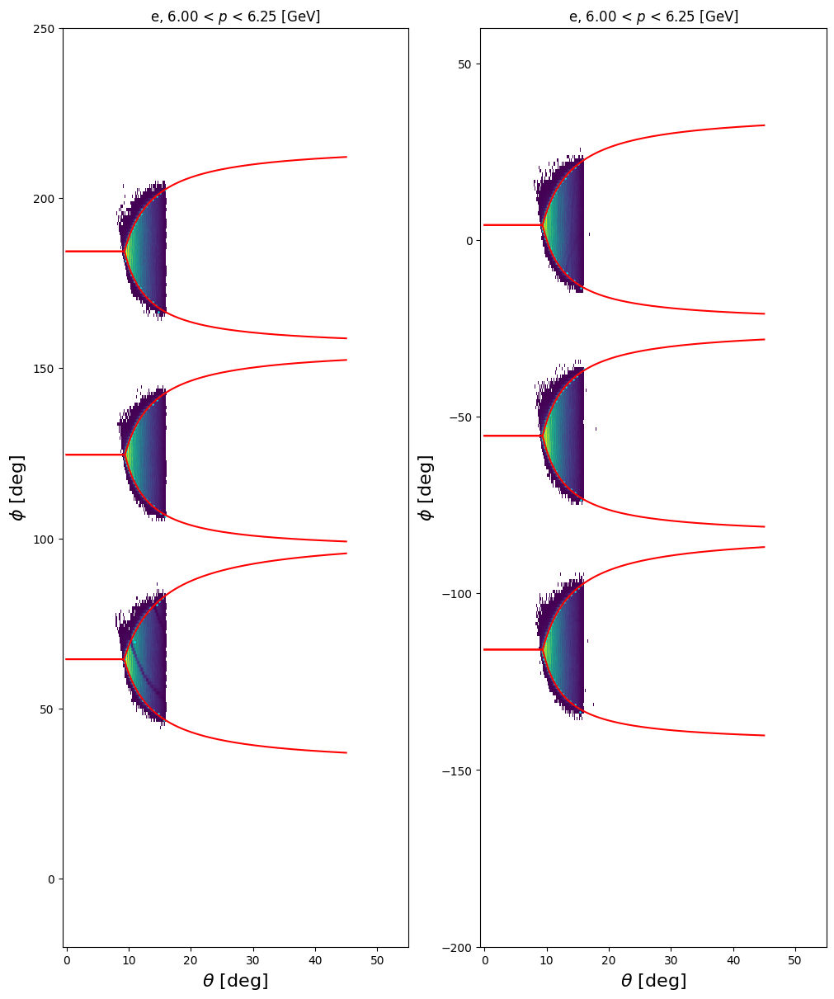

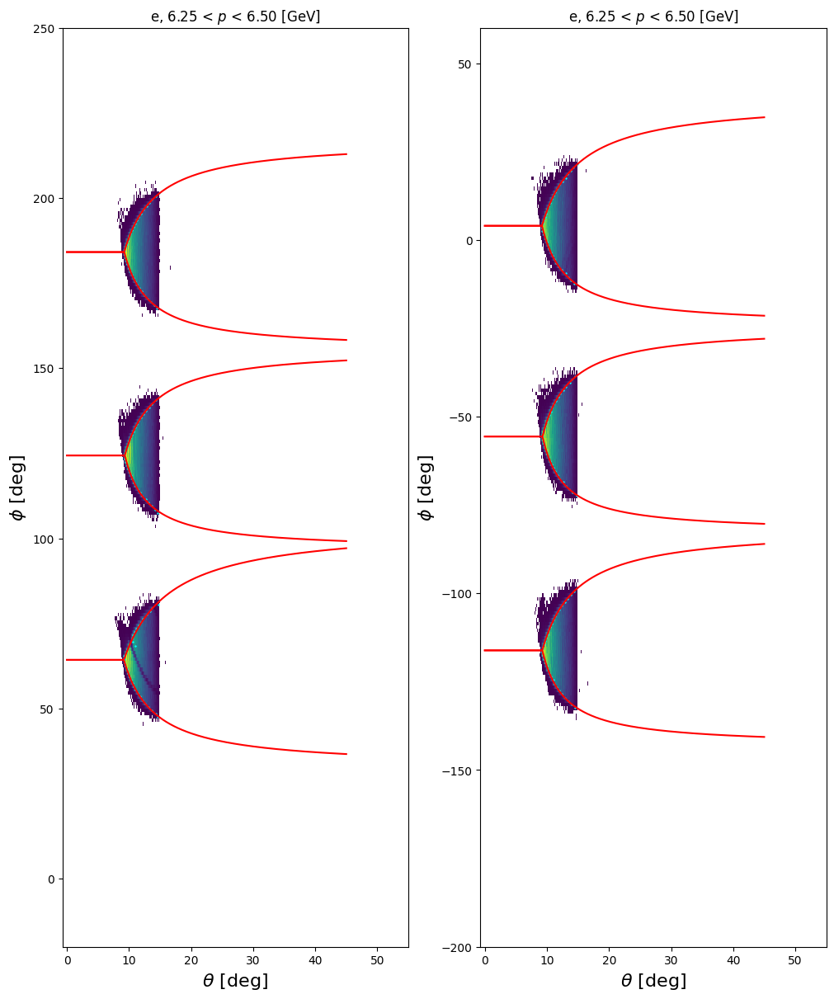

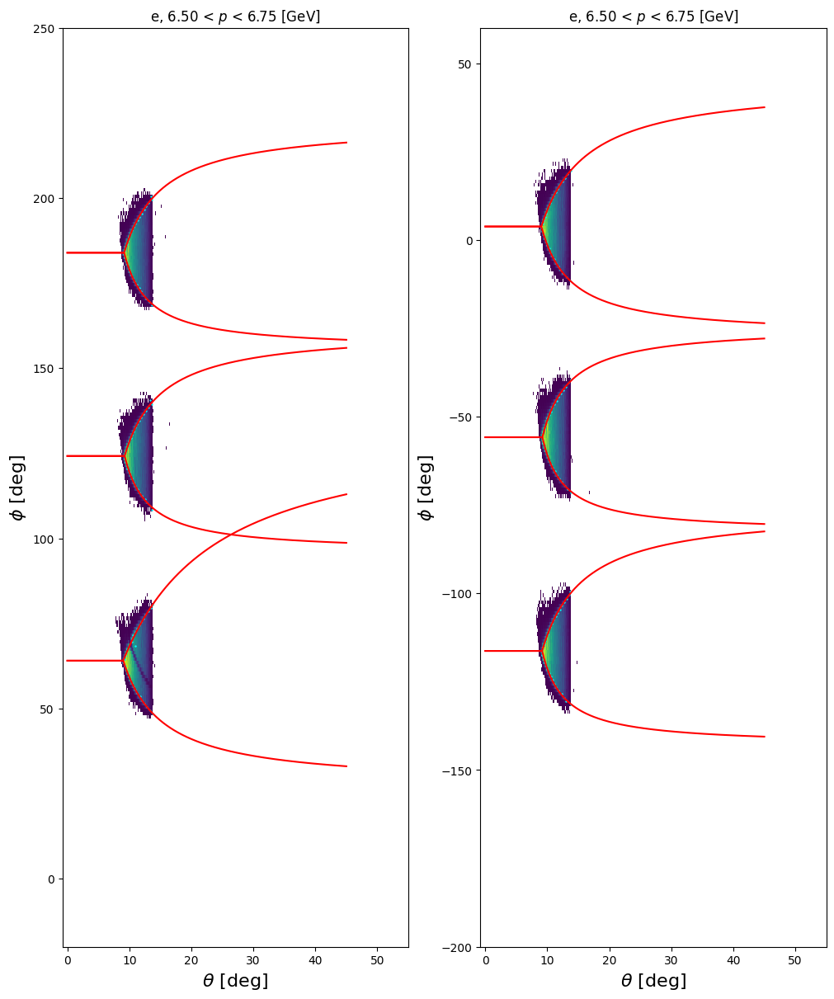

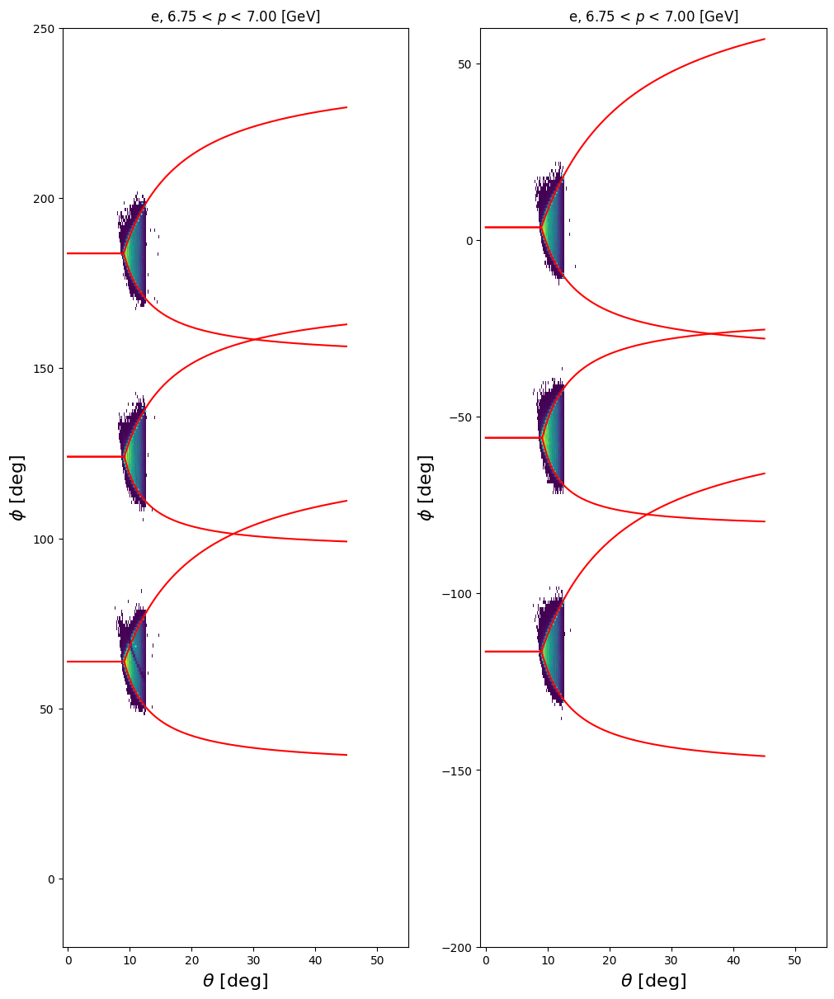

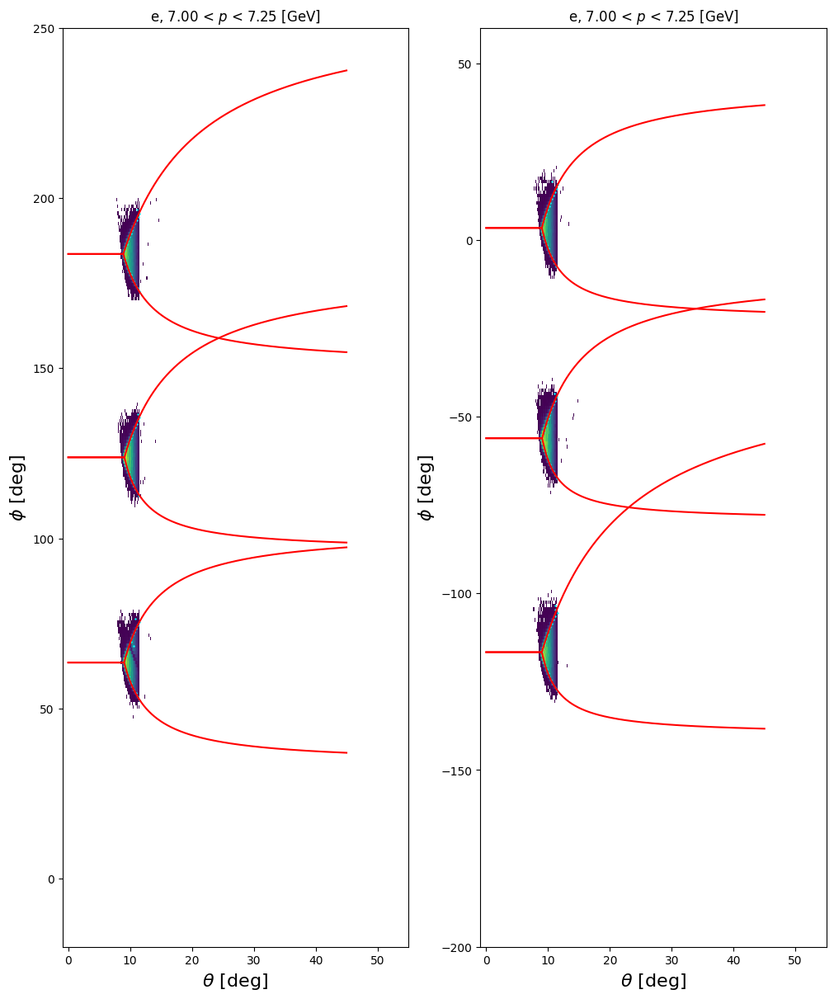

In [188]:
params_l1, params_l2, params_l3,  params_u1, params_u2,errs_l1, errs_l2, errs_l3, errs_u1, errs_u2 = doAnalysis(0)

In [ ]:
#electron and pip functions
def func_theta_min_el(x, p0, p1, p2, p3, p4, p5):
    return p0+ p1/x**2 +p2*x+ p3/x + p4*np.exp(p5*x) 
def func_el_a(x, p0, p1, p2, p3):
    return p0 + p1*np.exp(p2*(x-p3))
def func_el_b(x, p0, p1, p2, p3):
    return p0 + p1*x*np.exp(p2*(x-p3)**2)

def func_pim_a(x, p0, p1, p2, p3):
    return p0 - p1*np.arctan(p2*(x-p3))
def func_pim_b(x, p0, p1, p2, p3):
    return p0 + p1*x**2*np.exp(p2*(x-p3)**2)
    #return func_el_b(x, p0, p1, p2, p3)

def returnMap(x, p, theta_params, params, sector, phi_avg, parIdx, max):
    minimum_theta = expo(p, *theta_params[sector])   
    param_a_l, param_a_u, param_b_l, param_b_u = 0,0,0,0 
    
    
    param_a_l = func_el_a(p, *params[0][sector]) if parIdx < 2 else func_el_b(p, *params[0][sector])
    param_a_u =  func_el_a(p, *params[1][sector]) if parIdx < 2 else func_el_b(p, *params[1][sector])

    param_b_l =  func_el_b(p, *params[2][sector]) if parIdx < 2 else func_el_b(p, *params[2][sector])
    param_b_u =  func_el_b(p, *params[3][sector]) if parIdx < 2 else func_el_b(p, *params[3][sector])


    

  
    l_map = phiFunction_map(x, param_a_l,  minimum_theta, param_b_l,phi_avg, parIdx, -1, max)
    
    u_map = phiFunction_map(x, param_a_u,  minimum_theta, param_b_u, phi_avg, parIdx, 1, max) 

    return l_map, u_map

# Bounds for func_el_b: force p2 < 0 to prevent exp overflow
bounds_b      = ([-np.inf, -np.inf, -np.inf, -np.inf], [np.inf, np.inf, 0, np.inf])
# Bounds for expo theta_min: force b < 0 (theta_min decreases with momentum)
bounds_expo_t = ([-np.inf, -np.inf, -np.inf, -np.inf], [np.inf, 0,      np.inf, np.inf])

def _fit_robust(func, x, y, sigma, p0, bounds=(-np.inf, np.inf), max_nfev=1500000):
    """Drop-in replacement for curve_fit using soft_l1 robust loss.
    Returns popt only. Downweights outlier points from poorly-converged inner fits."""
    sigma_arr  = np.asarray(sigma, dtype=float)
    sigma_safe = np.where(sigma_arr > 0, sigma_arr, np.nanmax(np.abs(sigma_arr)) * 1e-3 + 1e-10)
    def res(p):
        return (func(x, *p) - y) / sigma_safe
    n  = len(p0)
    lb = list(bounds[0]) if hasattr(bounds[0], '__len__') else [bounds[0]] * n
    ub = list(bounds[1]) if hasattr(bounds[1], '__len__') else [bounds[1]] * n
    return least_squares(res, p0, loss='soft_l1', bounds=(lb, ub), max_nfev=max_nfev).x


In [ ]:
el_theta_min_params = []
e_params = [[] for _ in range(4)]

# Bin centres for the electron fits — matches doAnalysis(0) which steps range(0, 32, P_REBIN)
e_range = np.array([(p + P_REBIN / 2) * (5 / 40) + 3 for p in range(0, 32, P_REBIN)])
n_e     = len(e_range)

fig, ax = plt.subplots(2, 3, figsize=(10, 12), layout='constrained')
for i in range(6):
    axi = ax[i % 2, i // 2]
    yl = params_l1[i][:n_e]
    p0 = [float(yl[-1]), float(yl[0] - yl[-1]), -0.5, float(e_range[0])]
    axi.errorbar(e_range, yl, errs_l1[i][:n_e], marker='.', linestyle='-', color='blue', label='Lower')
    popt_a = _fit_robust(func_el_a, e_range, yl, errs_l1[i][:n_e], p0)
    axi.plot(np.linspace(3, 7, 100), func_el_a(np.linspace(3, 7, 100), *popt_a), color='navy')
    e_params[0].append(popt_a)

    yu = params_u1[i][:n_e]
    p0_u = [float(yu[-1]), float(yu[0] - yu[-1]), -0.5, float(e_range[0])]
    axi.errorbar(e_range, yu, errs_u1[i][:n_e], marker='.', linestyle='-', color='red', label='Upper')
    popt_a = _fit_robust(func_el_a, e_range, yu, errs_u1[i][:n_e], p0_u)
    axi.plot(np.linspace(3, 7, 100), func_el_a(np.linspace(3, 7, 100), *popt_a), color='maroon')
    e_params[1].append(popt_a)

    axi.set_xlabel(r"$p$ [GeV]", fontsize=16)
    axi.set_ylabel(r"$a^{e}$", fontsize=16)
    axi.set_ylim(20, 45)
ax[0, 0].legend(fontsize=16)
fig.savefig("analysis_note/acceptance_maps/e_param_a.png")

fig, ax = plt.subplots(2, 3, figsize=(10, 12), layout='constrained')
for i in range(6):
    axi = ax[i % 2, i // 2]
    xl_b = e_range[:-2]
    yl_b = params_l2[i][:n_e-2]
    peak_idx = int(np.argmax(yl_b))
    p0_b_l = [float(np.min(yl_b)),
               float((np.max(yl_b) - np.min(yl_b)) / xl_b[peak_idx]) if xl_b[peak_idx] != 0 else 1.0,
               -1.0,
               float(xl_b[peak_idx])]
    axi.errorbar(xl_b, yl_b, errs_l2[i][:n_e-2], marker='.', linestyle='-', color='blue', label='Lower')
    popt_b = _fit_robust(func_el_b, xl_b, yl_b, errs_l2[i][:n_e-2], p0_b_l, bounds=bounds_b)
    axi.plot(np.linspace(3, 7, 100), func_el_b(np.linspace(3, 7, 100), *popt_b), color='navy')
    e_params[2].append(popt_b)

    xu_b = e_range
    yu_b = params_u2[i][:n_e]
    peak_idx = int(np.argmax(yu_b))
    p0_b_u = [float(np.min(yu_b)),
               float((np.max(yu_b) - np.min(yu_b)) / xu_b[peak_idx]) if xu_b[peak_idx] != 0 else 1.0,
               -1.0,
               float(xu_b[peak_idx])]
    axi.errorbar(xu_b, yu_b, errs_u2[i][:n_e], marker='.', linestyle='-', color='red', label='Upper')
    popt_b = _fit_robust(func_el_b, xu_b, yu_b, errs_u2[i][:n_e], p0_b_u, bounds=bounds_b)
    axi.plot(np.linspace(3, 7, 100), func_el_b(np.linspace(3, 7, 100), *popt_b), color='maroon')
    e_params[3].append(popt_b)

    axi.set_xlabel(r"$p$ [GeV]", fontsize=16)
    axi.set_ylabel(r"$b^{e}$", fontsize=16)
ax[0, 0].legend(fontsize=16)
fig.savefig("analysis_note/acceptance_maps/e_param_b.png")

fig, ax = plt.subplots(2, 3, figsize=(10, 12), layout='constrained')
for i in range(6):
    axi = ax[i % 2, i // 2]
    yt = params_l3[i][:n_e]
    p0_t = [float(yt[0] - yt[-1]), -0.5, 0.5 * float(e_range[0]), float(yt[-1])]
    axi.errorbar(e_range, yt, errs_l3[i][:n_e], marker='.', linestyle='-', color='blue')
    popt_t = _fit_robust(expo, e_range, yt, errs_l3[i][:n_e], p0_t, bounds=bounds_expo_t)
    axi.plot(np.linspace(3, 7, 100), expo(np.linspace(3, 7, 100), *popt_t), color='navy')
    print(popt_t)
    el_theta_min_params.append(popt_t)
    axi.set_xlabel(r"$p$ [GeV]", fontsize=16)
    axi.set_ylabel(r"$\theta_{min}^{e}$", fontsize=16)
fig.savefig("analysis_note/acceptance_maps/e_param_theta_min.png")


/var/folders/4d/9x90517x6q3cc4_sz1jrqlj00000gn/T/ipykernel_94109/3307292032.py:23: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, pcov = curve_fit(doubleGauss, yEdges, values[phi], p0=p0)
/var/folders/4d/9x90517x6q3cc4_sz1jrqlj00000gn/T/ipykernel_94109/3307292032.py:34: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, pcov = curve_fit(linGauss, yEdges, values[phi], p0=p0)
/var/folders/4d/9x90517x6q3cc4_sz1jrqlj00000gn/T/ipykernel_94109/3039680006.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, pcov = curve_fit(trapezoid, xEdges, col, p0)
/var/folders/4d/9x90517x6q3cc4_sz1jrqlj00000gn/T/ipykernel_94109/4236377304.py:18: RuntimeWarning: invalid value encountered in divide
  lambda x: ((x3 - x) / (x3 - x2)) * height,


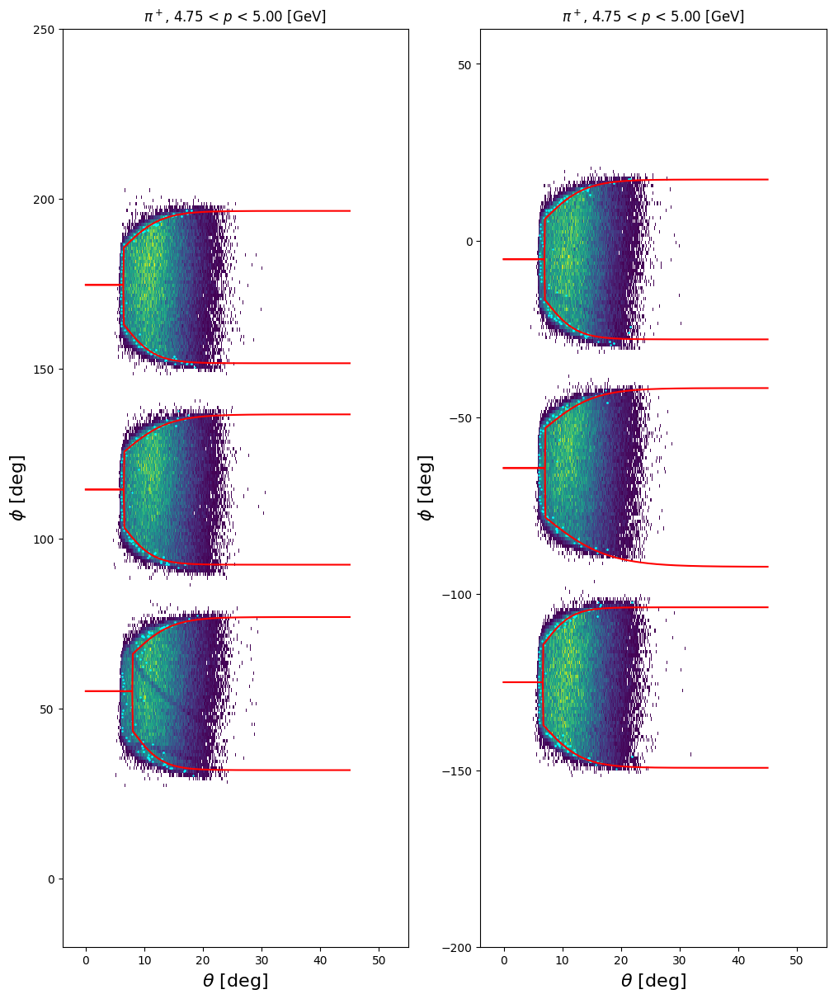

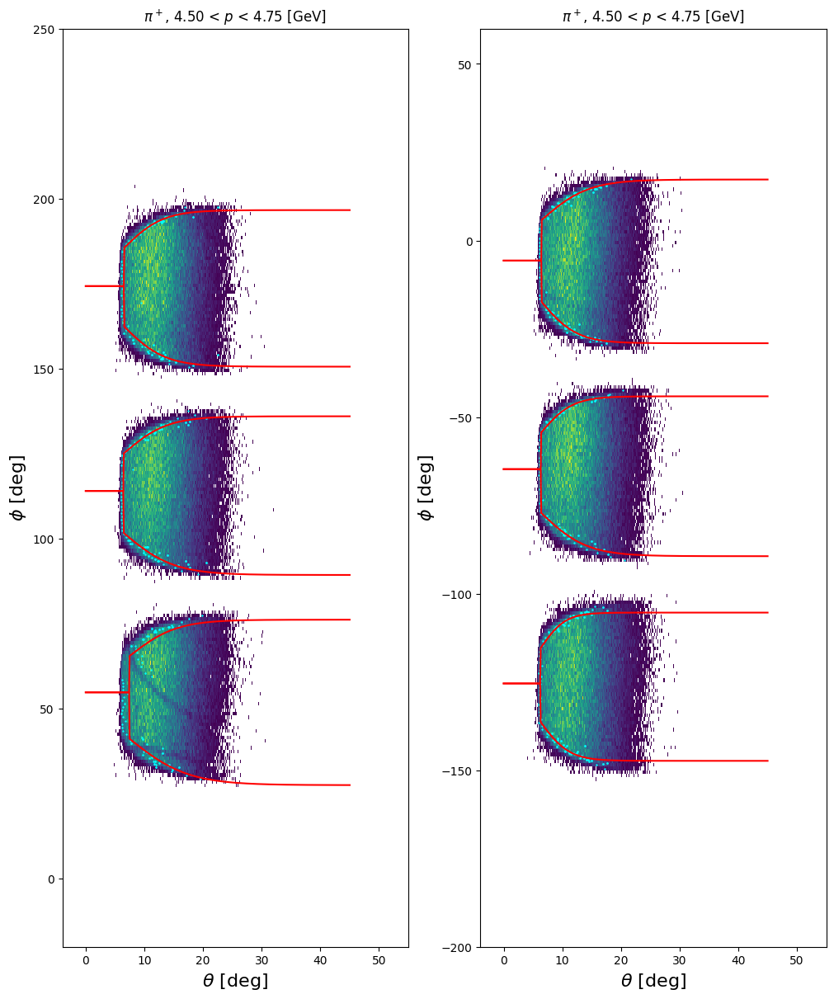

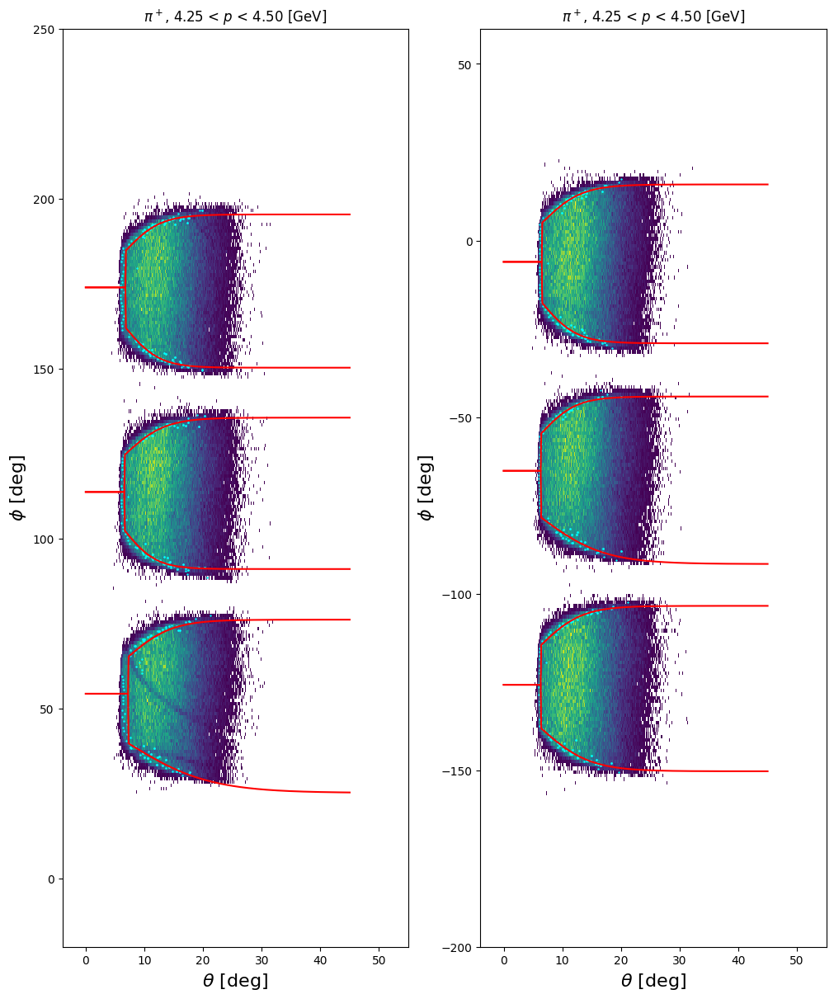

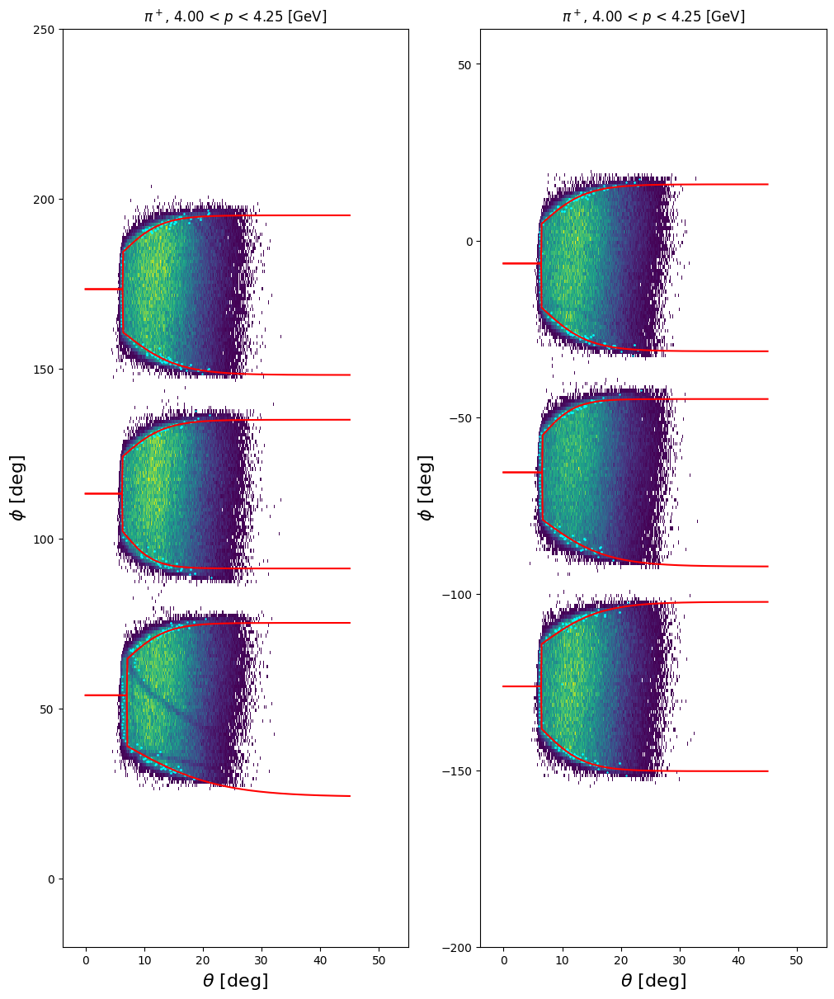

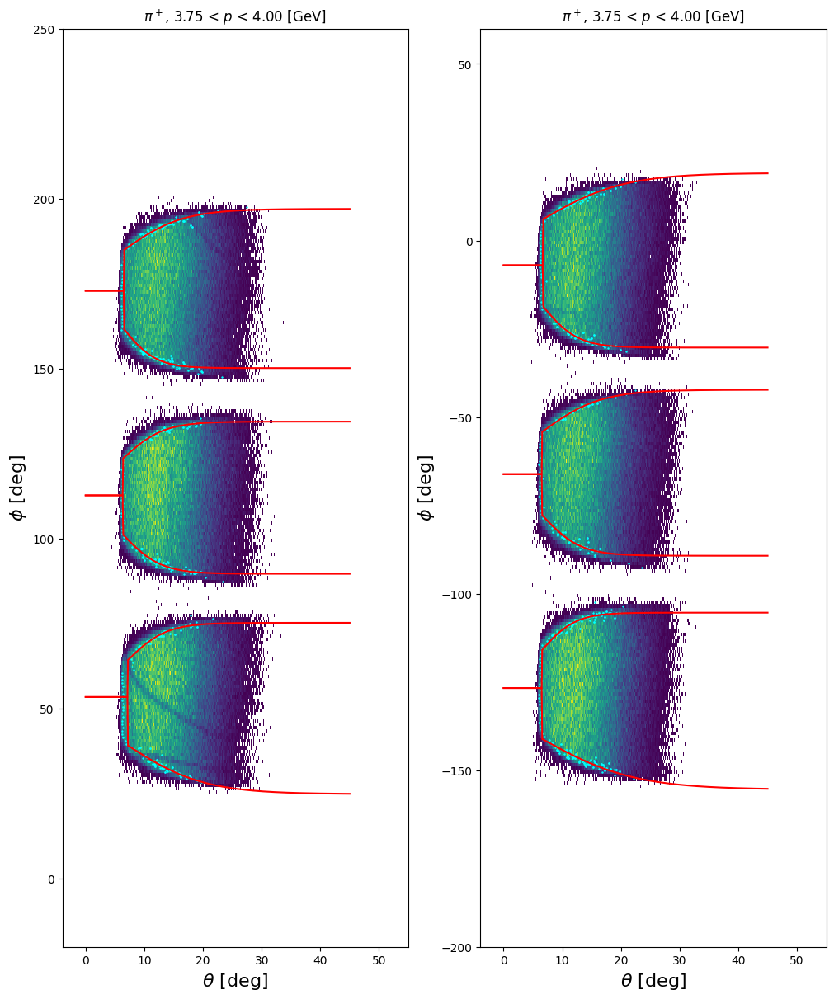

...

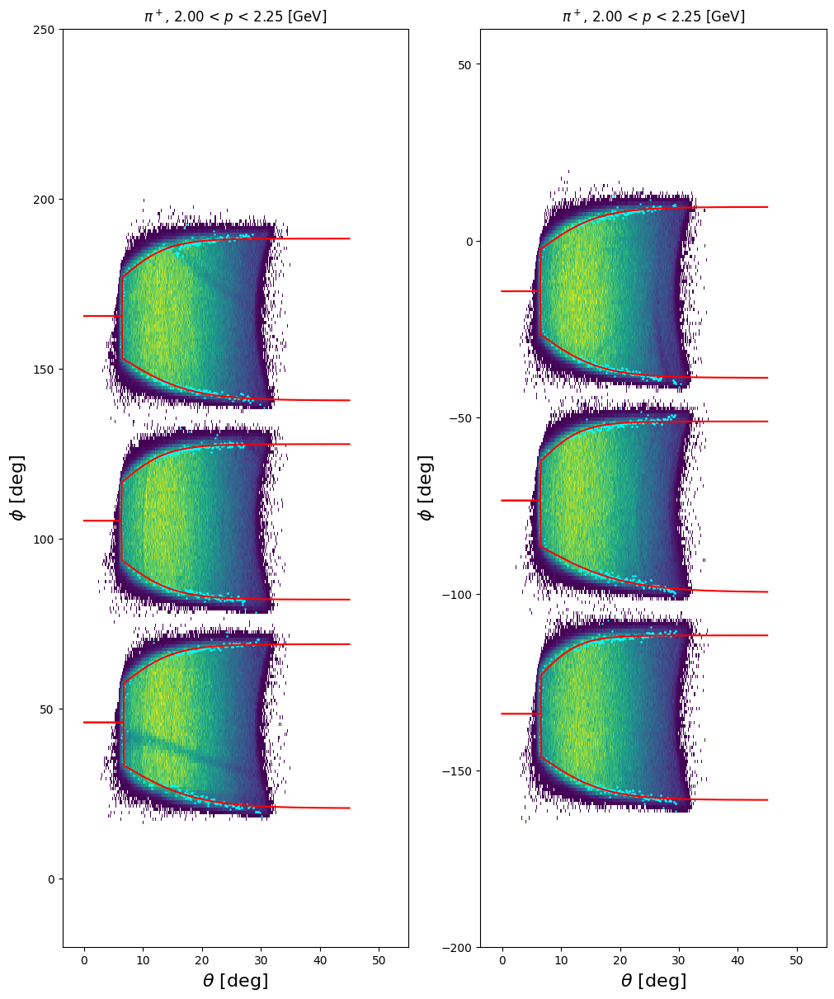

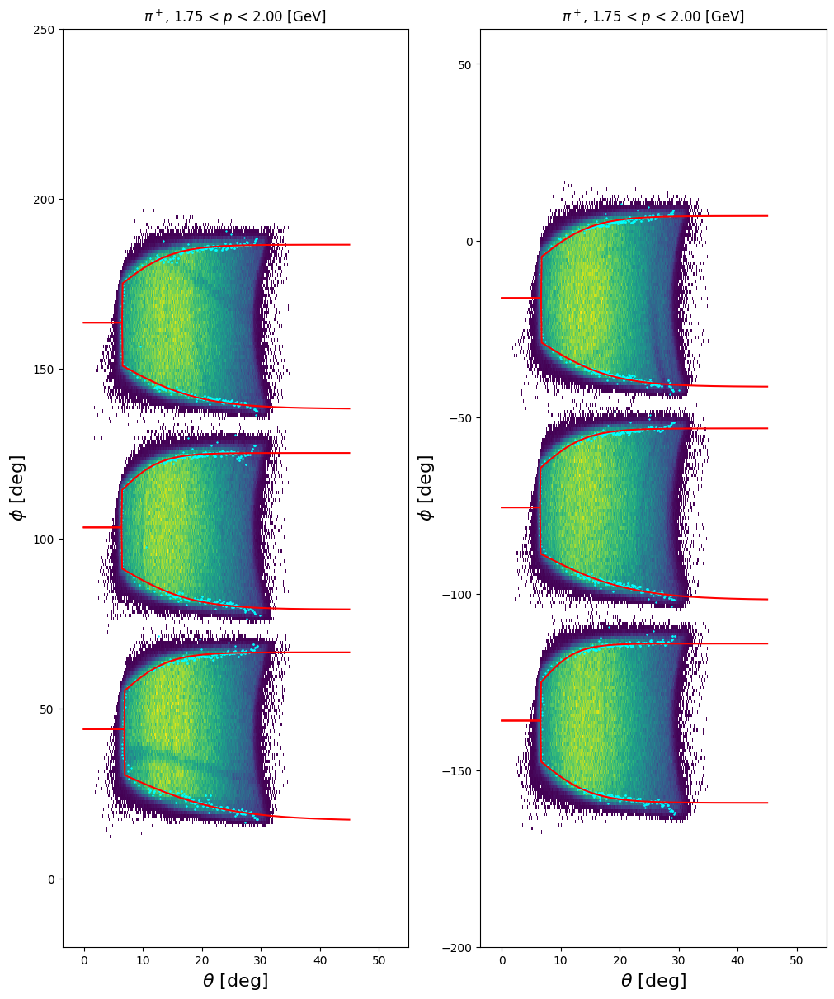

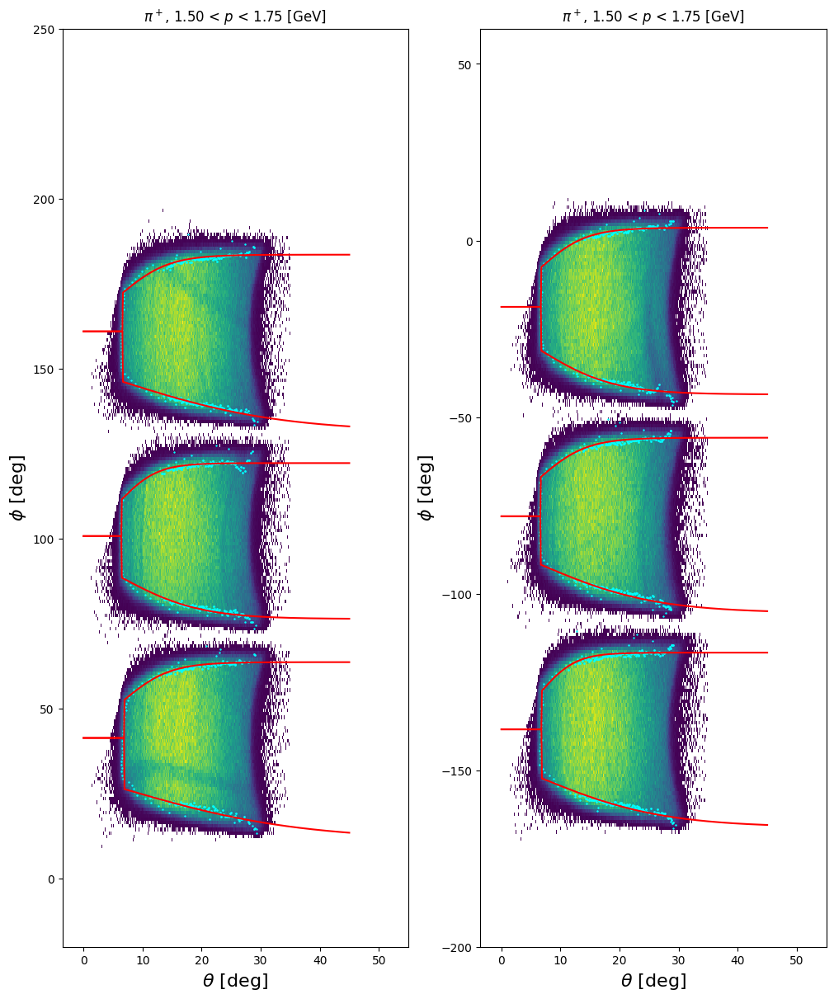

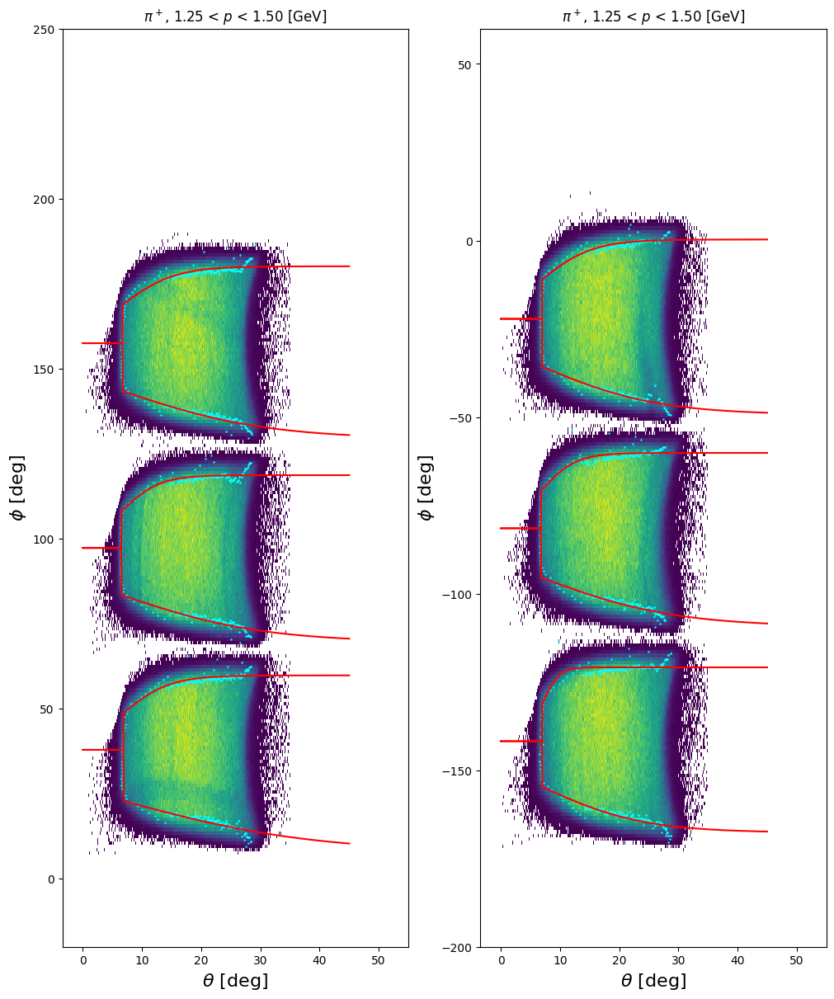

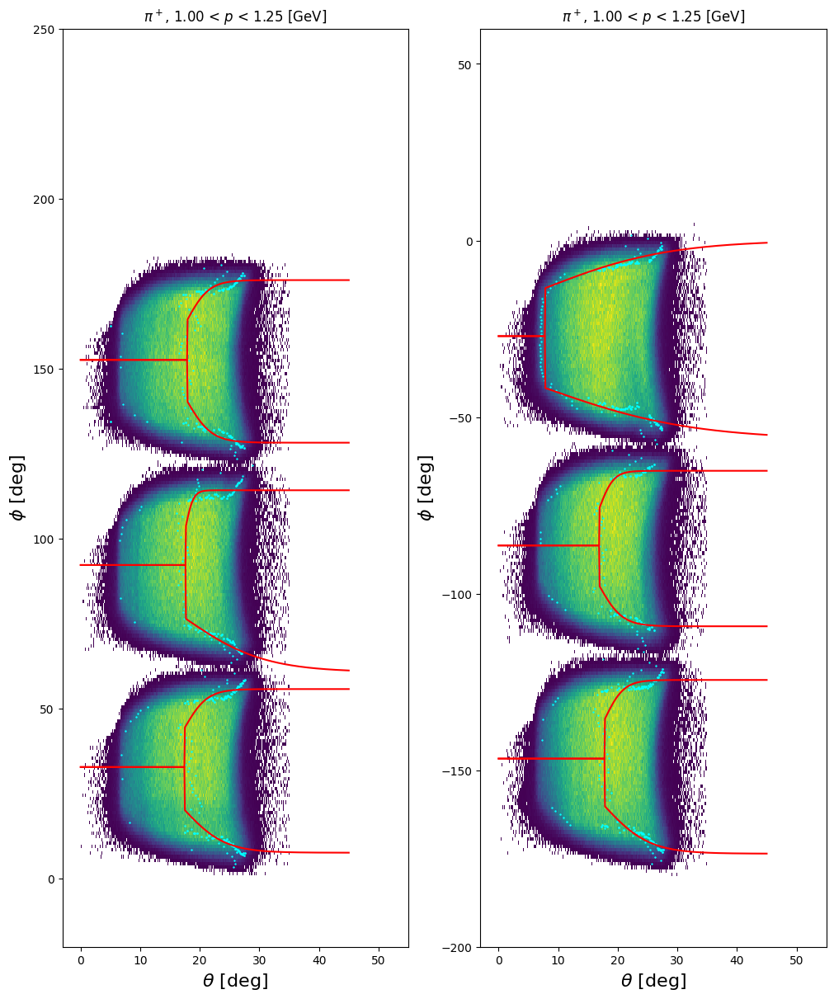

In [ ]:
params_pip_l1, params_pip_l2, params_pip_l3,  params_pip_u1, params_pip_u2,errs_pip_l1, errs_pip_l2, errs_pip_l3, errs_pip_u1, errs_pip_u2 = doAnalysis(1)

In [ ]:
# Bin centres for the pi+ fits — matches doAnalysis(1) which steps range(8, 40, P_REBIN)
pi_range = np.array([(p + P_REBIN / 2) * (5 / 40) for p in range(8, 40, P_REBIN)])
n_pi     = len(pi_range)

fig, ax = plt.subplots(2, 3, figsize=(10, 12), layout='constrained')
pip_theta_min_params = []
pip_params = [[] for _ in range(4)]

bounds_a = ([10, -20, 0, -5], [40, 0, 3, 7])

for i in range(6):
    axi = ax[i % 2, i // 2]
    xl = pi_range[1:]
    yl = np.asarray(params_pip_l1[i][1:n_pi])
    half_max = 0.5 * (float(np.max(yl)) + float(np.min(yl)))
    p3_est = float(xl[np.argmin(np.abs(yl - half_max))])
    p0_lower_i = [np.clip(float(np.max(yl)), 10., 40.),
                  np.clip(float(np.min(yl) - np.max(yl)), -20., 0.),
                  1.0,
                  np.clip(p3_est, -5., 7.)]
    axi.errorbar(xl, yl, errs_pip_l1[i][1:n_pi],
                 marker='.', linestyle='-', color='blue', label='Lower')
    popt_a = _fit_robust(func_el_a, xl, yl, errs_pip_l1[i][1:n_pi], p0_lower_i, bounds=bounds_a)
    axi.plot(np.linspace(0, 5, 100), func_el_a(np.linspace(0, 5, 100), *popt_a), color='navy')
    pip_params[0].append(popt_a)
    print(popt_a)

    yu = np.asarray(params_pip_u1[i][1:n_pi])
    half_max = 0.5 * (float(np.max(yu)) + float(np.min(yu)))
    p3_est = float(xl[np.argmin(np.abs(yu - half_max))])
    p0_upper_i = [np.clip(float(np.max(yu)), 10., 40.),
                  np.clip(float(np.min(yu) - np.max(yu)), -20., 0.),
                  1.0,
                  np.clip(p3_est, -5., 7.)]
    axi.errorbar(xl, yu, errs_pip_u1[i][1:n_pi],
                 marker='.', linestyle='-', color='red', label='Upper')
    popt_a = _fit_robust(func_el_a, xl, yu, errs_pip_u1[i][1:n_pi], p0_upper_i, bounds=bounds_a)
    axi.plot(np.linspace(0, 5, 100), func_el_a(np.linspace(0, 5, 100), *popt_a), color='maroon')
    pip_params[1].append(popt_a)

    axi.set_xlabel(r"$p$ [GeV]", fontsize=16)
    axi.set_ylabel(r"$a^{\pi+}$", fontsize=16)
ax[0, 0].legend(fontsize=16)
fig.savefig("analysis_note/acceptance_maps/pip_param_a.png")

fig, ax = plt.subplots(2, 3, figsize=(10, 12), layout='constrained')
for i in range(6):
    axi = ax[i % 2, i // 2]
    xl = pi_range[1:]
    yl_b = np.asarray(params_pip_l2[i][1:n_pi])
    peak_idx = int(np.argmax(yl_b))
    p0_b_l = [float(np.min(yl_b)),
               float((np.max(yl_b) - np.min(yl_b)) / xl[peak_idx]) if xl[peak_idx] != 0 else 0.1,
               -1.0,
               float(xl[peak_idx])]
    axi.errorbar(xl, yl_b, errs_pip_l2[i][1:n_pi],
                 marker='.', linestyle='-', color='blue', label='Lower')
    popt_b = _fit_robust(func_el_b, xl, yl_b, errs_pip_l2[i][1:n_pi], p0_b_l, bounds=bounds_b)
    axi.plot(np.linspace(0.5, 5, 100), func_el_b(np.linspace(0.5, 5, 100), *popt_b), color='navy')
    pip_params[2].append(popt_b)

    yu_b = np.asarray(params_pip_u2[i][1:n_pi])
    peak_idx = int(np.argmax(yu_b))
    p0_b_u = [float(np.min(yu_b)),
               float((np.max(yu_b) - np.min(yu_b)) / xl[peak_idx]) if xl[peak_idx] != 0 else 0.1,
               -1.0,
               float(xl[peak_idx])]
    axi.errorbar(xl, yu_b, errs_pip_u2[i][1:n_pi],
                 marker='.', linestyle='-', color='red', label='Upper')
    popt_b = _fit_robust(func_el_b, xl, yu_b, errs_pip_u2[i][1:n_pi], p0_b_u, bounds=bounds_b)
    axi.plot(np.linspace(0.75, 5, 100), func_el_b(np.linspace(0.75, 5, 100), *popt_b), color='maroon')
    pip_params[3].append(popt_b)

    axi.set_xlabel(r"$p$ [GeV]", fontsize=16)
    axi.set_ylabel(r"$b^{\pi+}$", fontsize=16)
    axi.set_ylim(0, 10)
ax[0, 0].legend(fontsize=16)
fig.savefig("analysis_note/acceptance_maps/pip_param_b.png")

fig, ax = plt.subplots(2, 3, figsize=(10, 12), layout='constrained')
for i in range(6):
    axi = ax[i % 2, i // 2]
    x   = pi_range[1:]
    y   = np.asarray(params_pip_l3[i][1:n_pi])
    err = np.asarray(errs_pip_l3[i][1:n_pi])
    mask = err > 0.001
    x_m, y_m, err_m = x[mask], y[mask], err[mask]
    axi.errorbar(x_m, y_m, err_m, marker='.', linestyle='-', color='blue')
    p0_t = [float(y_m[0] - y_m[-1]), -0.5, 0.5 * float(x_m[0]), float(y_m[-1])]
    popt_t = _fit_robust(expo, x_m, y_m, err_m, p0_t, bounds=bounds_expo_t)
    axi.plot(np.linspace(0.5, 5, 100), expo(np.linspace(0.5, 5, 100), *popt_t), color='navy')
    pip_theta_min_params.append(popt_t)
    axi.set_xlabel(r"$p$ [GeV]", fontsize=16)
    axi.set_ylabel(r"$\theta_{min}^{\pi+}$", fontsize=16)
fig.savefig("analysis_note/acceptance_maps/pip_param_theta_min.png")


/var/folders/4d/9x90517x6q3cc4_sz1jrqlj00000gn/T/ipykernel_94109/3307292032.py:23: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, pcov = curve_fit(doubleGauss, yEdges, values[phi], p0=p0)
/var/folders/4d/9x90517x6q3cc4_sz1jrqlj00000gn/T/ipykernel_94109/3307292032.py:34: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, pcov = curve_fit(linGauss, yEdges, values[phi], p0=p0)
/var/folders/4d/9x90517x6q3cc4_sz1jrqlj00000gn/T/ipykernel_94109/3039680006.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, pcov = curve_fit(trapezoid, xEdges, col, p0)
/var/folders/4d/9x90517x6q3cc4_sz1jrqlj00000gn/T/ipykernel_94109/4236377304.py:18: RuntimeWarning: invalid value encountered in divide
  lambda x: ((x3 - x) / (x3 - x2)) * height,


IndexError: too many indices for array: array is 1-dimensional, but 2 were indexed

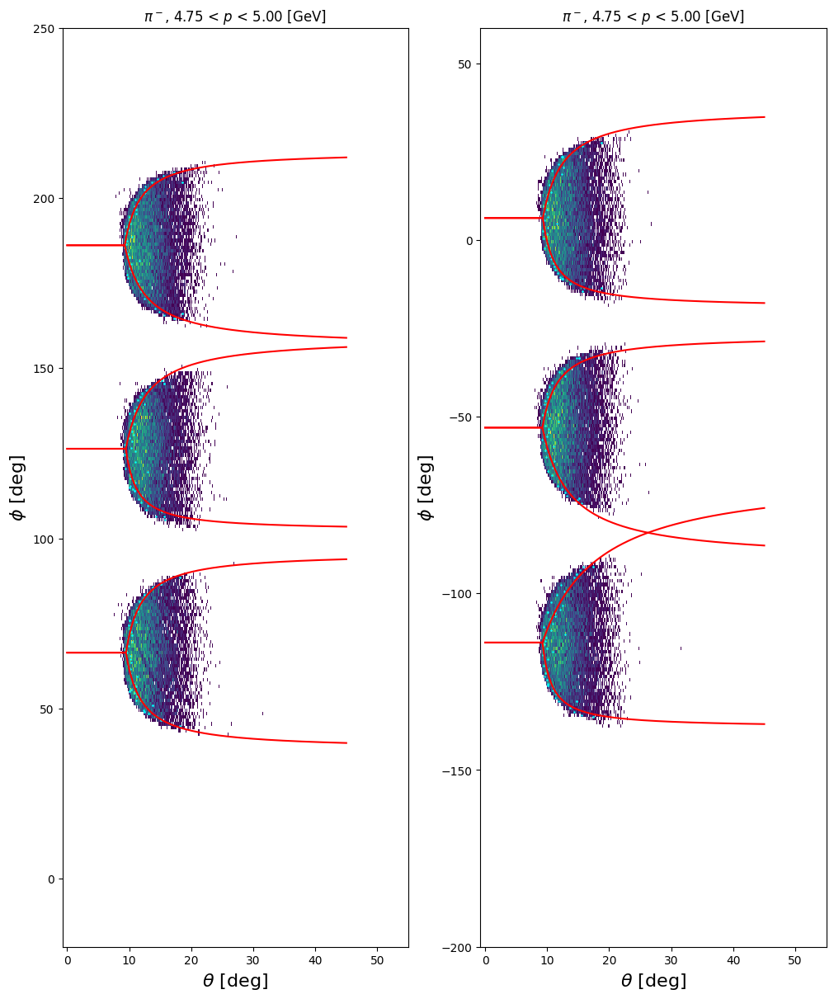

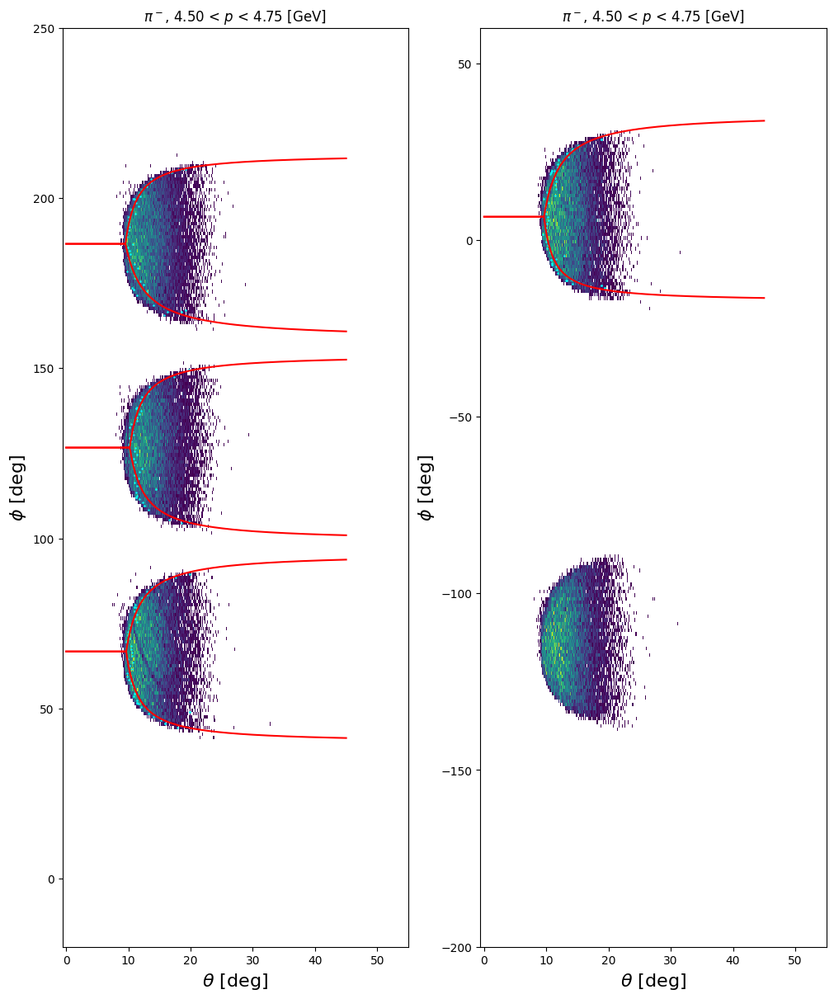

In [ ]:
params_pim_l1, params_pim_l2, params_pim_l3,  params_pim_u1, params_pim_u2,errs_pim_l1, errs_pim_l2, errs_pim_l3, errs_pim_u1, errs_pim_u2 = doAnalysis(2)

In [ ]:
# Bin centres for the pi- fits — matches doAnalysis(2) which steps range(8, 40, P_REBIN)
pi_range = np.array([(p + P_REBIN / 2) * (5 / 40) for p in range(8, 40, P_REBIN)])
n_pi     = len(pi_range)
x_plot   = np.linspace(0.5, 5, 100)

pim_theta_min_params = []
pim_params = [[] for _ in range(4)]

params_pim_l1 = np.asarray(params_pim_l1)
params_pim_u1 = np.asarray(params_pim_u1)
errs_pim_l1   = np.asarray(errs_pim_l1)
errs_pim_u1   = np.asarray(errs_pim_u1)
params_pim_l2 = np.asarray(params_pim_l2)
params_pim_u2 = np.asarray(params_pim_u2)
errs_pim_l2   = np.asarray(errs_pim_l2)
errs_pim_u2   = np.asarray(errs_pim_u2)

fit_configs = [
    # (params_l, params_u, errs_l, errs_u, ylabel, savepath, store_indices, func, mask_thresh, low_point_fn)
    (params_pim_l1, params_pim_u1, errs_pim_l1, errs_pim_u1, r"$a^{\pi-}$", "pim_param_a.png", [0, 1], func_el_b, 100,  lambda i: 0),
    (params_pim_l2, params_pim_u2, errs_pim_l2, errs_pim_u2, r"$b^{\pi-}$", "pim_param_b.png", [2, 3], func_el_b, 1000, lambda i: 2 if i == 2 else 1),
]

for (params_l, params_u, errs_l, errs_u, ylabel, savepath, store_idx, func, thresh, low_pt) in fit_configs:
    fig, ax = plt.subplots(2, 3, figsize=(10, 12), layout='constrained')

    datasets = [
        (params_l, errs_l, 'blue', 'navy',   'Lower', pim_params[store_idx[0]]),
        (params_u, errs_u, 'red',  'maroon',  'Upper', pim_params[store_idx[1]]),
    ]

    for i in range(6):
        axi = ax[i % 2, i // 2]
        lp  = low_pt(i)
        for params, errs, color, fit_color, label, store in datasets:
            mask = (params[i][lp:n_pi] < thresh) & (errs[i][lp:n_pi] < thresh)
            x, y, e = pi_range[lp:n_pi][mask], params[i][lp:n_pi][mask], errs[i][lp:n_pi][mask]
            axi.errorbar(x, y, e, marker='.', linestyle='-', color=color, label=label)
            peak_idx = int(np.argmax(y))
            p0_i = [float(np.min(y)),
                    float((np.max(y) - np.min(y)) / x[peak_idx]) if x[peak_idx] != 0 else 1.0,
                    -1.0,
                    float(x[peak_idx])]
            popt = _fit_robust(func, x, y, e, p0_i, bounds=bounds_b)
            axi.plot(x_plot, func(x_plot, *popt), color=fit_color)
            store.append(popt)

        axi.set_xlabel(r"$p$ [GeV]", fontsize=16)
        axi.set_ylabel(ylabel, fontsize=16)

    ax[0, 0].legend(fontsize=16)
    fig.savefig(f"analysis_note/acceptance_maps/{savepath}")

# theta_min plot
fig, ax = plt.subplots(2, 3, figsize=(10, 12), layout='constrained')
for i in range(6):
    axi = ax[i % 2, i // 2]
    y_t = params_pim_l3[i][:n_pi]
    p0_t = [float(y_t[0] - y_t[-1]), -0.5, 0.5 * float(pi_range[0]), float(y_t[-1])]
    axi.errorbar(pi_range, y_t, errs_pim_l3[i][:n_pi],
                 marker='.', linestyle='-', color='blue')
    popt_t = _fit_robust(expo, pi_range, y_t, errs_pim_l3[i][:n_pi], p0_t, bounds=bounds_expo_t)
    print(popt_t)
    axi.plot(x_plot, expo(x_plot, *popt_t), color='navy')
    pim_theta_min_params.append(popt_t)
    axi.set_xlabel(r"$p$ [GeV]", fontsize=16)
    axi.set_ylabel(r"$\theta_{min}^{\pi-}$", fontsize=16)
fig.savefig("analysis_note/acceptance_maps/pim_param_theta_min.png")


In [ ]:

parIdx = [0, 1, 2]

max_par  = [[[] for sec in range(6)] for par in range(3)]
mean_par = [[[] for sec in range(6)] for par in range(3)]

ylabels_max  = [r"$\theta_{\mathrm{max}}^{e}$",    r"$\theta_{\mathrm{max}}^{\pi+}$",  r"$\theta_{\mathrm{max}}^{\pi-}$"]
ylabels_mean = [r"$\phi_{\mathrm{mean}}^{e}$",       r"$\phi_{\mathrm{mean}}^{\pi+}$",   r"$\phi_{\mathrm{mean}}^{\pi-}$"]
xlabels      = [r"$p_e$ [GeV]",                      r"$p_{\pi+}$ [GeV]",                r"$p_{\pi-}$ [GeV]"]

# p_low/p_high per particle match the doAnalysis loop boundaries
_p_bounds = [(0, 32), (8, 40), (6, 40)]  # (p_low, p_high) for e, pi+, pi-
_dp       = [5/40, 5/40, 5/40]           # GeV per bin
_p_offset = [3,    0,    0   ]           # momentum offset (electrons start at 3 GeV)

for i in parIdx:
    p_low, p_high = _p_bounds[i]
    Range = range(p_low, p_high, P_REBIN)

    # Bin-centre momentum values for the rebinned grid
    xvals = np.array([(p + P_REBIN / 2) * _dp[i] + _p_offset[i] for p in Range])
    xfit  = np.linspace(xvals.min() - 0.25, xvals.max(), 300)

    fig_max,  axes_max  = plt.subplots(2, 3, figsize=(18, 10), sharex=True, sharey=True)
    fig_mean, axes_mean = plt.subplots(2, 3, figsize=(18, 10), sharex=True)
    axes_max  = axes_max.flatten()
    axes_mean = axes_mean.flatten()

    for sector in range(6):
        max_array  = []
        mean_array = []

        for p in Range:
            _, x_mean, max_theta = getHistMean(i, p, sector)
            max_array.append(max_theta)
            mean_array.append(x_mean)

        max_array  = np.array(max_array)
        mean_array = np.array(mean_array)
        p0 = [float(mean_array[-1]),
              float(mean_array[0] - mean_array[-1]),
              -1.350657]

        popt_max,  _ = curve_fit(poly3, xvals, max_array,  maxfev=1500000)
        popt_mean, _ = curve_fit(power, xvals, mean_array, maxfev=1500000, p0=p0)
        max_par[i][sector].append(popt_max)
        mean_par[i][sector].append(popt_mean)

        axes_max[sector].plot(xvals, max_array,              marker='o', linestyle=' ')
        axes_max[sector].plot(xfit,  poly3(xfit, *popt_max), linestyle='-')
        axes_max[sector].set_title(f"Sector {sector+1}")

        axes_mean[sector].plot(xvals, mean_array,               marker='o', linestyle=' ')
        axes_mean[sector].plot(xfit,  power(xfit, *popt_mean),  linestyle='-')
        axes_mean[sector].set_title(f"Sector {sector+1}")

    for axes in [axes_max, axes_mean]:
        for a in axes:
            a.tick_params(axis='both', labelsize=12)

    fig_max.supxlabel(xlabels[i], fontsize=22)
    fig_max.supylabel(ylabels_max[i], fontsize=22)
    fig_max.tight_layout(rect=[0, 0, 1, 0.95])

    fig_mean.supxlabel(xlabels[i], fontsize=22)
    fig_mean.supylabel(ylabels_mean[i], fontsize=22)
    fig_mean.tight_layout(rect=[0, 0, 1, 0.95])

    plt.show()
    fig_mean.savefig(f"analysis_note/acceptance_maps/{par_list[i]}_phi_mean.png")
    fig_max.savefig(f"analysis_note/acceptance_maps/{par_list[i]}_theta_max.png")


NameError: name 'pim_theta_min_params' is not defined

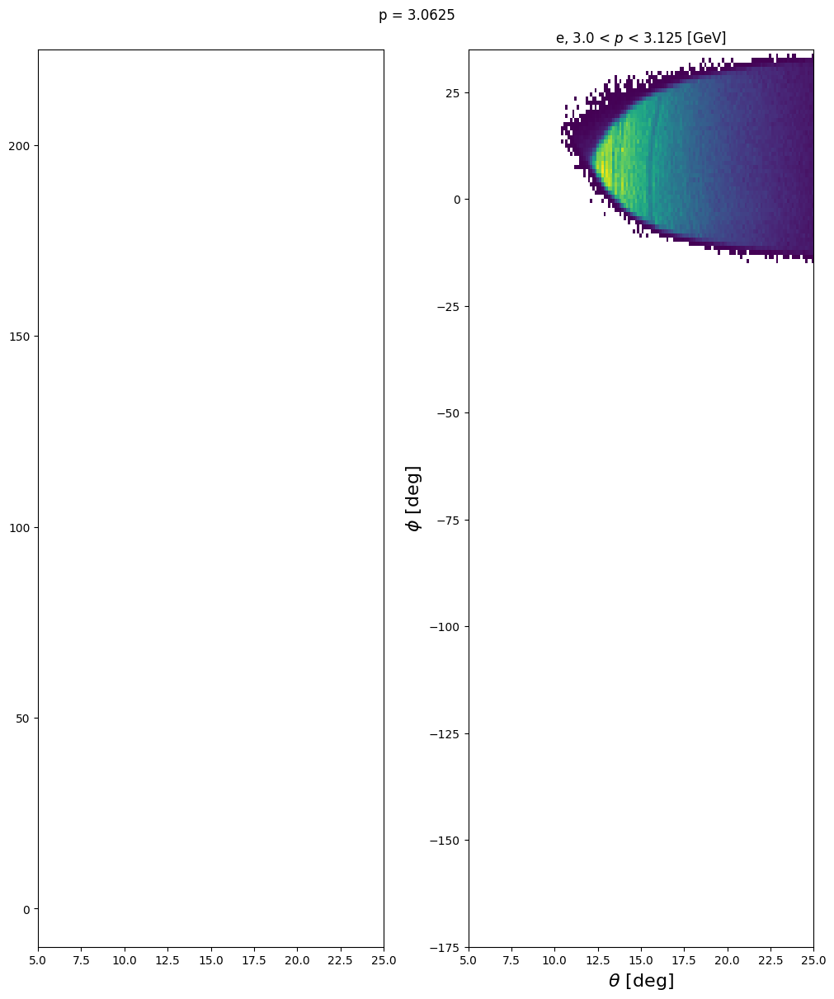

In [ ]:


parIdx = 0
i = parIdx
side = 1
phi_avg =0
theta_min_fixed = 0

p_min = 0 if i == 0 else 4
p_max = 32 if i == 0 else 40
Range = range(p_min, p_max) if i==0 else reversed(range(p_min, p_max))
for p in Range:
    
    fig, ax = plt.subplots(1, 2, figsize=(10,12), layout='constrained')
    fig.suptitle(f'p = {3*(parIdx == 0) + (p+.5)*(5/40)}')
    for sector in [0,1,2,3,4,5]:
        pan = 0 if sector in [1,2,3] else 1
        
        
        plot_fit(parIdx, p, sector, ax[pan])
        y_mean, x_mean, max_theta = getHistMean(parIdx, p, sector)
        low_val = 10#np.min(low) if np.min(low) > 0 else 10
    
        

        ax[0].set_xlim(low_val-5, 25)
        ax[1].set_xlim(low_val-5, 25)

        ax[0].set_ylim(-10, 225)
        ax[1].set_ylim(-175,35)

        p_low = 3*(parIdx == 0) + p*(5/40)
        p_mid = 3*(parIdx == 0) + (p+.5)*(5/40)
        p_high = 3*(parIdx == 0) + (p+1)*(5/40)
        phi_avg = x_mean

        max_low = poly3( p_low, *max_par[i][sector][0])        
        max_mid = poly3( p_mid, *max_par[i][sector][0])        
        max_high = poly3( p_high, *max_par[i][sector][0])        

        theta_min_params = [el_theta_min_params,pip_theta_min_params,pim_theta_min_params]
        params = [ e_params, pip_params, pim_params]
        
        low_loose, up_loose = returnMap(phi_range, p_low,
                                        theta_min_params[i], 
                                        params[i], sector, 
                                        power(p_low, *(mean_par[i][sector][0])), 
                                        parIdx, max_low)
        low_mid, up_mid = returnMap(phi_range, p_mid, theta_min_params[i], params[i], sector, power(p_mid, *(mean_par[i][sector][0])), parIdx, max_mid)
        low_tight, up_tight = returnMap(phi_range, p_high, theta_min_params[i], params[i], sector, power(p_high, *(mean_par[i][sector][0])), parIdx, max_high)
        
        ax[pan].text( max_mid, power(p_mid, *(mean_par[i][sector][0])), f"Sector {sector+1}", color='Green')

        mask = np.array(low_loose) != np.array(up_loose)

        side=-1
        #ax[pan].plot( phi_range[mask], np.array(low_loose)[mask],color='red',linewidth=1)
        #ax[pan].plot( phi_range, low_mid,color='white',linewidth=1)
        ax[pan].plot( phi_range, low_tight,color='cyan',linewidth=1)
        
        #ax[pan].plot( phi_range[mask], np.array(up_loose)[mask],color='red',linewidth=1)
        #ax[pan].plot( phi_range, up_mid,color='white',linewidth=1)
        ax[pan].plot( phi_range, up_tight,color='cyan',linewidth=1)


        #side=1
        ##ax[pan].plot( phi_range, phiFunction_fixed(phi_range, *popt_low),color='red')
      

In [ ]:
out_file = ROOT.TFile("acceptanceMap_allE_final.root", "RECREATE")
pars   = ['e', 'pip', 'pim']
params = ['lower_a', 'upper_a', 'lower_b', 'upper_b', 'theta', 'max', 'mean']

func = [
    "[0] + [1]*exp([2]*(x-[3]))",             # 0: lower/upper_a
    "[0] + [1]*x*exp([2]*(x-[3])*(x-[3]))",   # 1: lower/upper_b
    "[0]*exp([1]*(x-[2])) + [3]",             # 2: theta
    "[0] + [1]*x + [2]*x*x + [3]*x*x*x",     # 3: max
    "[0] + [1]*pow(x, [2])",                  # 4: mean
]

func_list = [
#    la  ua   lb   ub   theta  max  mean
    [0,  0,   1,   1,   2,     3,   4],   # e
    [0,  0,   1,   1,   2,     3,   4],   # pip
    [1,  1,   1,   1,   2,     3,   4],   # pim
]

theta_min_params = [el_theta_min_params, pip_theta_min_params, pim_theta_min_params]
param_array      = [e_params, pip_params, pim_params]

f_params = [[[ROOT.TF1(f"f_{pars[i]}_{sec+1}_param_{params[j]}",
                       func[func_list[i][j]], 0, 8)
              for j in range(len(params))]
             for sec in range(6)]
            for i in range(len(pars))]

for i in range(3):
    for sec in range(6):
        for l in range(4):                                           # lower/upper a and b
            f_params[i][sec][l].SetParameters(*param_array[i][l][sec])
            f_params[i][sec][l].Write()
        f_params[i][sec][4].SetParameters(*theta_min_params[i][sec])  # theta
        f_params[i][sec][4].Write()
        f_params[i][sec][5].SetParameters(*max_par[i][sec][0])        # max
        f_params[i][sec][5].Write()
        f_params[i][sec][6].SetParameters(*mean_par[i][sec][0])       # mean
        f_params[i][sec][6].Write()

out_file.Close()


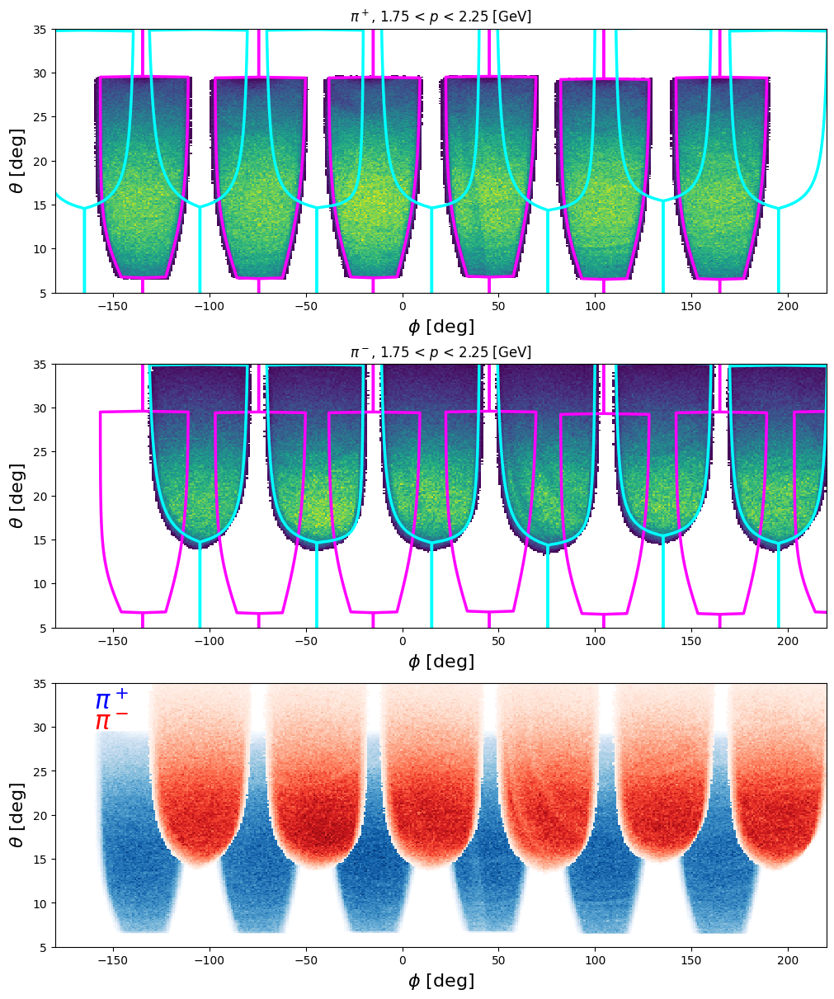

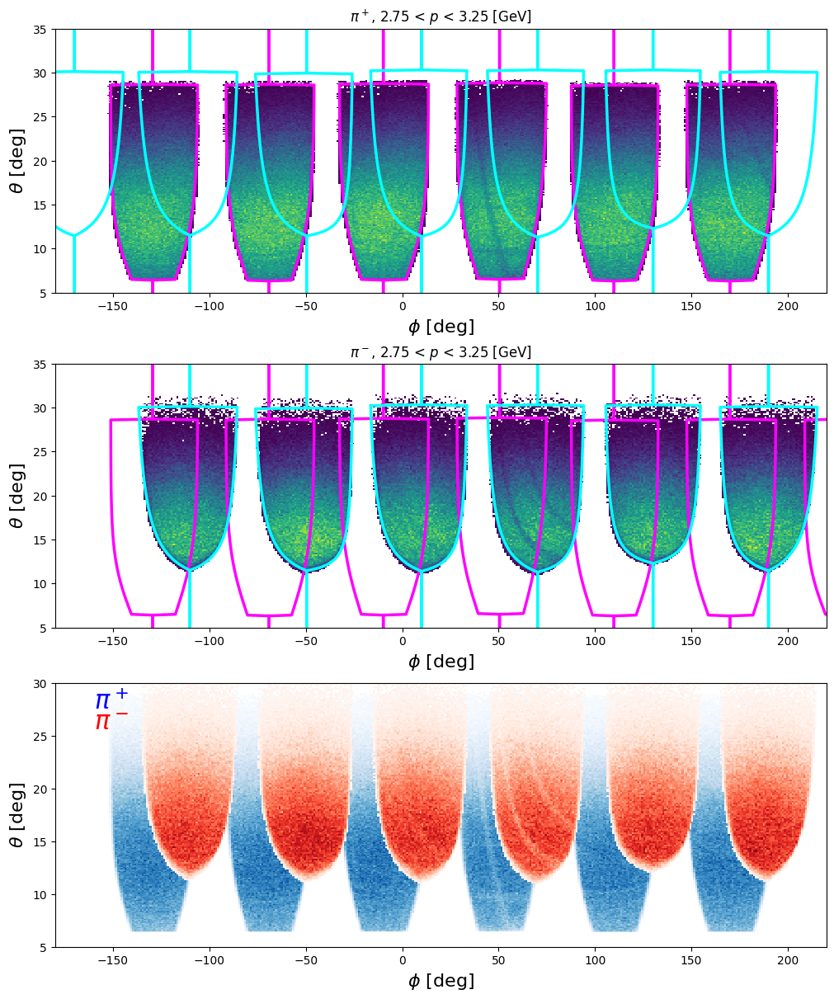

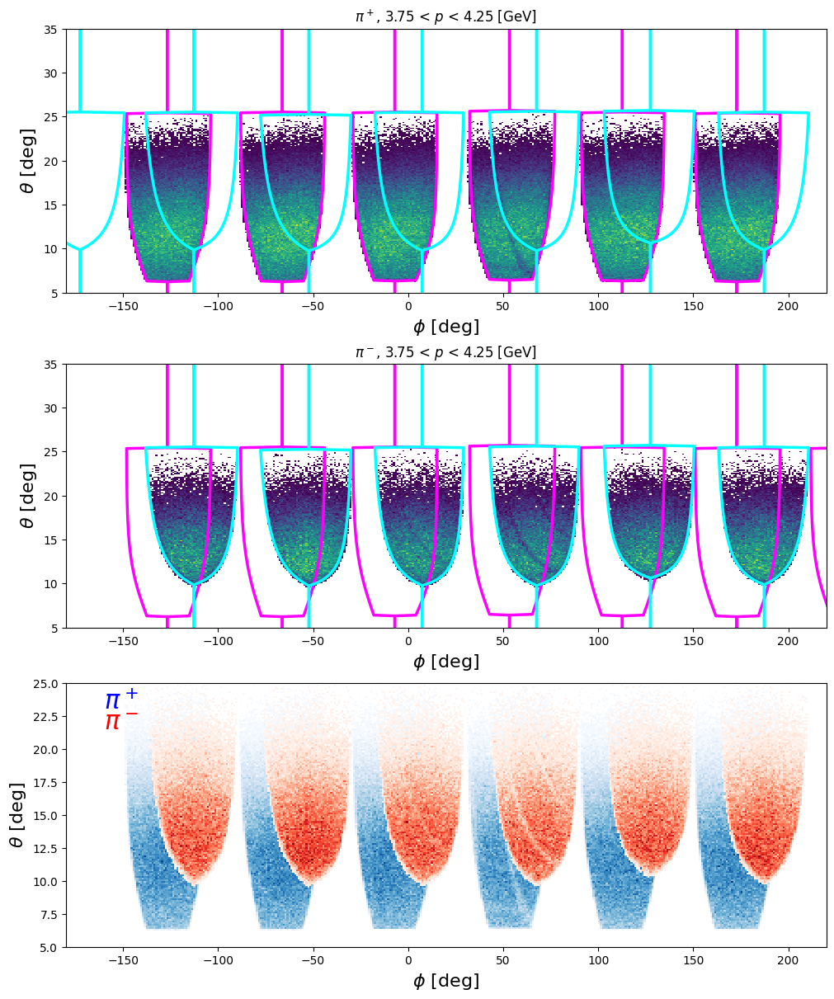

In [ ]:


p_pi = [2,3,4]

inFile_max = ROOT.TFile.Open("../data/acceptance_map/acceptanceMap_allE_final.root", "READ")
#inFile_max = ROOT.TFile.Open("acceptanceMap_allE_final.root", "READ")

hFile_0 = uproot.open("../histograms/analysis_note/theta_phi_analysis.root")

for p in p_pi:
    fig, ax = plt.subplots(3, 1, figsize=(10,12), layout='constrained')

    ax[2].set_ylim(5, 35 - 5*(p-2))
    ax[2].set_xlim(-180,220)      

    for i in range(1,3):

        
        parIdx = i - 1
        ax[i-1].set_title(rf"{par_title[parIdx+1]}, {p-.25} < $p$ < {p+.25} [GeV]")

        ax[i-1].set_xlabel( r"$\phi$ [deg]", fontsize=16)
        ax[i-1].set_ylabel( r"$\theta$ [deg]", fontsize=16)

        ax[i-1].set_ylim(5, 35 )#- 5*(p-2))
        ax[i-1].set_xlim(-180,220)    

        hist_0 = hFile_0[f'hThetaPhi_sec_bin_{p-2}_{par_list[parIdx+1]};1']

                    
        values = hist_0.values()          
        values[values==0] = np.nan
        xEdges = hist_0.axis(0).centers()
        yEdges = hist_0.axis(1).centers()

        color = 'Reds' if parIdx==1 else 'Blues'
        ax[parIdx].pcolormesh(xEdges, yEdges, values.T, cmap='viridis', shading='nearest')
        ax[2].pcolormesh(xEdges, yEdges, values.T, cmap=color, shading='nearest', label=par_list[parIdx])
        
        pan = parIdx
        for sector in range(6):
            fLower_a = [inFile_max.Get( f"f_{par_list[parIdx+1]}_{sec+1}_param_lower_a;1") for sec in range(6)]
            fUpper_a = [inFile_max.Get( f"f_{par_list[parIdx+1]}_{sec+1}_param_upper_a;1") for sec in range(6)]
            fLower_b = [inFile_max.Get( f"f_{par_list[parIdx+1]}_{sec+1}_param_lower_b;1") for sec in range(6)]
            fUpper_b = [inFile_max.Get( f"f_{par_list[parIdx+1]}_{sec+1}_param_upper_b;1") for sec in range(6)]
            fMean = [inFile_max.Get( f"f_{par_list[parIdx+1]}_{sec+1}_param_mean;1") for sec in range(6)]
            fMax = [inFile_max.Get( f"f_{par_list[parIdx+1]}_{sec+1}_param_max;1") for sec in range(6)]
            fTheta = [inFile_max.Get( f"f_{par_list[parIdx+1]}_{sec+1}_param_theta;1") for sec in range(6)]

            max_params = [[fMax[sec].GetParameter(j) for j in range(4)]  for sec in range(6)]
            mean_params =[ [fMean[sec].GetParameter(j) for j in range(3)]  for sec in range(6)]
            upper_a = [[fUpper_a[sec].GetParameter(j) for j in range(4)] for sec in range(6)]
            lower_a = [[fLower_a[sec].GetParameter(j) for j in range(4)] for sec in range(6)]
            upper_b = [[fUpper_b[sec].GetParameter(j) for j in range(4)] for sec in range(6)]
            lower_b = [[fLower_b[sec].GetParameter(j) for j in range(4)] for sec in range(6)]
            theta_min_params = [[fTheta[sec].GetParameter(j) for j in range(4)] for sec in range(6)]

            params_new = [lower_a, upper_a, lower_b, upper_b ]

            phi_avg = power( p, *mean_params[sector])     
            max_low = poly3( p, *max_params[sector])        


            shift = 0.0 if i ==2 else -0.0

            low_loose, up_loose = returnMap(phi_range, p + shift,
                                            theta_min_params, 
                                            params_new, sector, 
                                            power(p, *(mean_params[sector])), 
                                            i, max_low)
                        
            color = 'magenta' if i==1 else 'cyan'
            ax[0].plot( low_loose, phi_range,color=color, linewidth=2.5)
            ax[0].plot( up_loose, phi_range,color=color, linewidth=2.5)

          
            
            ax[1].plot( low_loose, phi_range,color=color, linewidth=2.5)
            ax[1].plot( up_loose, phi_range,color=color, linewidth=2.5)

            if sector == 3 and i == 2:
                ax[0].plot( low_loose-360, phi_range,color=color, linewidth=2.5)
                ax[0].plot( up_loose-360, phi_range,color=color, linewidth=2.5)
            if sector == 4 and i ==1:
                ax[1].plot( low_loose+360, phi_range,color=color, linewidth=2.5)
                ax[1].plot( up_loose+360, phi_range,color=color, linewidth=2.5)

    ax[2].text(0.05, 0.9, r'$\pi^+$', color='blue', fontsize=22, transform = ax[2].transAxes)
    ax[2].text(0.05, 0.825, r'$\pi^-$', color='red', fontsize=22, transform = ax[2].transAxes)
    ax[2].set_xlabel( r"$\phi$ [deg]", fontsize=16)
    ax[2].set_ylabel( r"$\theta$ [deg]", fontsize=16)

TypeError: expo() takes 5 positional arguments but 7 were given

Error in <TFormula::GetParameter>: wrong index used - use GetParameter(name)
Error in <TFormula::GetParameter>: wrong index used - use GetParameter(name)
Error in <TFormula::GetParameter>: wrong index used - use GetParameter(name)
Error in <TFormula::GetParameter>: wrong index used - use GetParameter(name)
Error in <TFormula::GetParameter>: wrong index used - use GetParameter(name)
Error in <TFormula::GetParameter>: wrong index used - use GetParameter(name)
Error in <TFormula::GetParameter>: wrong index used - use GetParameter(name)
Error in <TFormula::GetParameter>: wrong index used - use GetParameter(name)
Error in <TFormula::GetParameter>: wrong index used - use GetParameter(name)
Error in <TFormula::GetParameter>: wrong index used - use GetParameter(name)
Error in <TFormula::GetParameter>: wrong index used - use GetParameter(name)
Error in <TFormula::GetParameter>: wrong index used - use GetParameter(name)
Error in <TFormula::GetParameter>: wrong index used - use GetParameter(name)

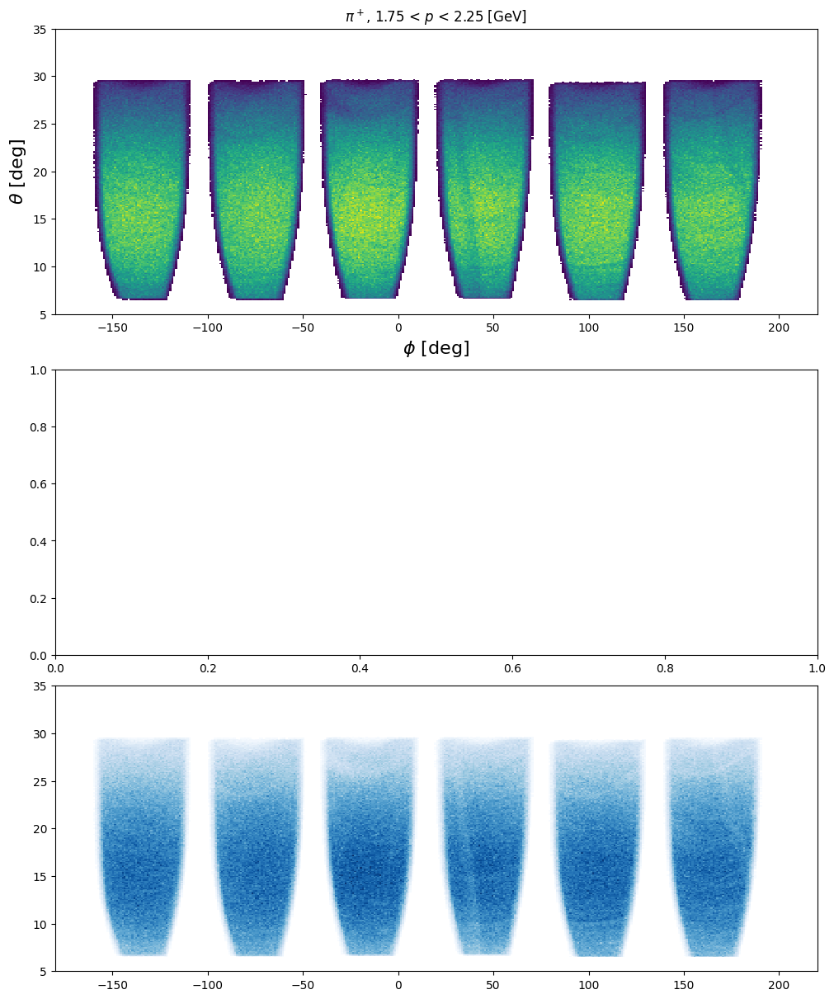

In [ ]:
p_pi = [2,3,4]

inFile_max = ROOT.TFile.Open("../data/acceptance_map/acceptanceMap_allE_final.root", "READ")
hFile_0 = uproot.open("../histograms/analysis_note/theta_phi_analysis.root")

for p in p_pi:
    fig, ax = plt.subplots(3, 1, figsize=(10,12), layout='constrained')

    ax[2].set_ylim(5, 35 - 5*(p-2))
    ax[2].set_xlim(-180,220)      

    for i in range(1,3):

        
        parIdx = i - 1
        ax[i-1].set_title(rf"{par_title[parIdx+1]}, {p-.25} < $p$ < {p+.25} [GeV]")

        ax[i-1].set_xlabel( r"$\phi$ [deg]", fontsize=16)
        ax[i-1].set_ylabel( r"$\theta$ [deg]", fontsize=16)

        ax[i-1].set_ylim(5, 35 - 5*(p-2))
        ax[i-1].set_xlim(-180,220)    

        hist_0 = hFile_0[f'hThetaPhi_sec_bin_{p-2}_{par_list[parIdx+1]};1']

                    
        values = hist_0.values()          
        values[values==0] = np.nan
        xEdges = hist_0.axis(0).centers()
        yEdges = hist_0.axis(1).centers()

        color = 'Reds' if parIdx==1 else 'Blues'
        ax[parIdx].pcolormesh(xEdges, yEdges, values.T, cmap='viridis', shading='nearest')
        ax[2].pcolormesh(xEdges, yEdges, values.T, cmap=color, shading='nearest', label=par_list[parIdx])
        
        pan = parIdx
        for sector in range(6):
            fLower_a = [inFile_max.Get( f"f_{par_list[parIdx+1]}_{sec+1}_param_lower_a;1") for sec in range(6)]
            fUpper_a = [inFile_max.Get( f"f_{par_list[parIdx+1]}_{sec+1}_param_upper_a;1") for sec in range(6)]
            fLower_b = [inFile_max.Get( f"f_{par_list[parIdx+1]}_{sec+1}_param_lower_b;1") for sec in range(6)]
            fUpper_b = [inFile_max.Get( f"f_{par_list[parIdx+1]}_{sec+1}_param_upper_b;1") for sec in range(6)]
            fMean_pip = [inFile_max.Get( f"f_pip_{sec+1}_param_mean;1") for sec in range(6)]
            fMean_pim = [inFile_max.Get( f"f_pim_{sec+1}_param_mean;1") for sec in range(6)]
            fMax = [inFile_max.Get( f"f_{par_list[parIdx+1]}_{sec+1}_param_max;1") for sec in range(6)]
            fTheta = [inFile_max.Get( f"f_{par_list[parIdx+1]}_{sec+1}_param_theta;1") for sec in range(6)]

            max_params = [[fMax[sec].GetParameter(j) for j in range(4)]  for sec in range(6)]
            mean_pip_params =[ [fMean_pip[sec].GetParameter(j) for j in range(4)]  for sec in range(6)]
            mean_pim_params =[ [fMean_pim[sec].GetParameter(j) for j in range(4)]  for sec in range(6)]

            upper_a = [[fUpper_a[sec].GetParameter(j) for j in range(4)] for sec in range(6)]
            lower_a = [[fLower_a[sec].GetParameter(j) for j in range(4)] for sec in range(6)]
            upper_b = [[fUpper_b[sec].GetParameter(j) for j in range(4)] for sec in range(6)]
            lower_b = [[fLower_b[sec].GetParameter(j) for j in range(4)] for sec in range(6)]
            theta_min_params = [[fTheta[sec].GetParameter(j) for j in range(6)] for sec in range(6)]
            

            params_new = [lower_a, upper_a, lower_b, upper_b ]

            phi_avg_pip = poly3( p, *mean_pip_params[sector])     
            phi_avg_pim = poly3( p, *mean_pim_params[sector])     

            max_low = poly3( p, *max_params[sector])        


            shift = 0.0 if i ==2 else -0.0

            low_loose_pip, up_loose_pip = returnMap(phi_range, p + shift,
                                            theta_min_params, 
                                            params_new, sector, 
                                            poly3(p, *(mean_pip_params[sector])), 
                                            i, max_low)
            
            low_loose_pim, up_loose_pim = returnMap(phi_range, p + shift,
                                            theta_min_params, 
                                            params_new, sector, 
                                            poly3(p, *(mean_pim_params[sector])), 
                                            i, max_low)
            
            
            
            color = 'magenta' if i==1 else 'cyan'
            ax[0].plot( low_loose_pip, phi_range,color=color, linewidth=2.5)
            ax[0].plot( up_loose_pip, phi_range,color=color, linewidth=2.5)

          
            
            ax[1].plot( low_loose_pim, phi_range,color=color, linewidth=2.5)
            ax[1].plot( up_loose_pim, phi_range,color=color, linewidth=2.5)


    ax[2].text(0.05, 0.9, r'$\pi^+$', color='blue', fontsize=22, transform = ax[2].transAxes)
    ax[2].text(0.05, 0.825, r'$\pi^-$', color='red', fontsize=22, transform = ax[2].transAxes)
    ax[2].set_xlabel( r"$\phi$ [deg]", fontsize=16)
    ax[2].set_ylabel( r"$\theta$ [deg]", fontsize=16)


TypeError: expo() takes 5 positional arguments but 7 were given

Error in <TFormula::GetParameter>: wrong index used - use GetParameter(name)
Error in <TFormula::GetParameter>: wrong index used - use GetParameter(name)
Error in <TFormula::GetParameter>: wrong index used - use GetParameter(name)
Error in <TFormula::GetParameter>: wrong index used - use GetParameter(name)
Error in <TFormula::GetParameter>: wrong index used - use GetParameter(name)
Error in <TFormula::GetParameter>: wrong index used - use GetParameter(name)
Error in <TFormula::GetParameter>: wrong index used - use GetParameter(name)
Error in <TFormula::GetParameter>: wrong index used - use GetParameter(name)
Error in <TFormula::GetParameter>: wrong index used - use GetParameter(name)
Error in <TFormula::GetParameter>: wrong index used - use GetParameter(name)
Error in <TFormula::GetParameter>: wrong index used - use GetParameter(name)
Error in <TFormula::GetParameter>: wrong index used - use GetParameter(name)
Error in <TFormula::GetParameter>: wrong index used - use GetParameter(name)

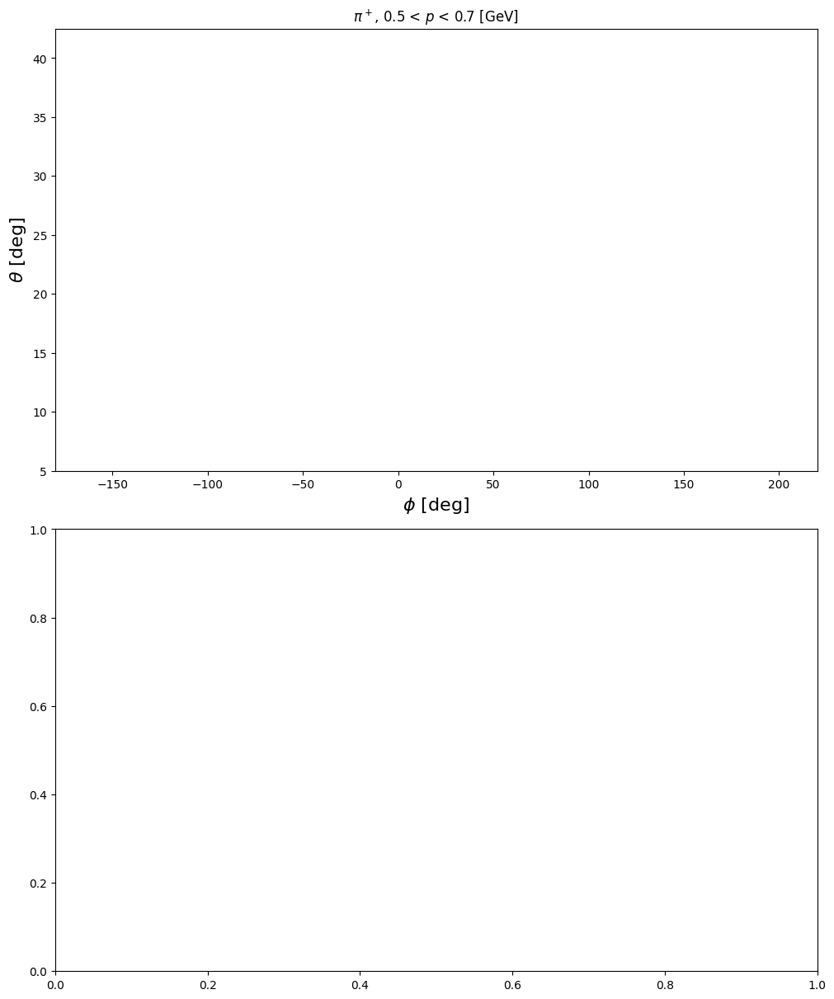

In [ ]:
p_pi = np.linspace(.5, 1.5, 5)

inFile_max = ROOT.TFile.Open("acceptanceMap_allE_final.root", "READ")

for p in p_pi:
    fig, ax = plt.subplots(2, 1, figsize=(10,12), layout='constrained')


    for i in range(1,3):

        
        parIdx = i - 1
        ax[i-1].set_title(rf"{par_title[parIdx+1]}, {p} < $p$ < {p+(1.5-.5)/5} [GeV]")

        ax[i-1].set_xlabel( r"$\phi$ [deg]", fontsize=16)
        ax[i-1].set_ylabel( r"$\theta$ [deg]", fontsize=16)

        ax[i-1].set_ylim(5, 35 - 5*(p-2))
        ax[i-1].set_xlim(-180,220)    


        color = 'Reds' if parIdx==1 else 'Blues'
    
        pan = parIdx
        for sector in range(6):
            fLower_a = [inFile_max.Get( f"f_{par_list[parIdx+1]}_{sec+1}_param_lower_a;1") for sec in range(6)]
            fUpper_a = [inFile_max.Get( f"f_{par_list[parIdx+1]}_{sec+1}_param_upper_a;1") for sec in range(6)]
            fLower_b = [inFile_max.Get( f"f_{par_list[parIdx+1]}_{sec+1}_param_lower_b;1") for sec in range(6)]
            fUpper_b = [inFile_max.Get( f"f_{par_list[parIdx+1]}_{sec+1}_param_upper_b;1") for sec in range(6)]
            fMean = [inFile_max.Get( f"f_{par_list[parIdx+1]}_{sec+1}_param_mean;1") for sec in range(6)]
            fMax = [inFile_max.Get( f"f_{par_list[parIdx+1]}_{sec+1}_param_max;1") for sec in range(6)]
            fTheta = [inFile_max.Get( f"f_{par_list[parIdx+1]}_{sec+1}_param_theta;1") for sec in range(6)]

            max_params = [[fMax[sec].GetParameter(j) for j in range(4)]  for sec in range(6)]
            mean_params =[ [fMean[sec].GetParameter(j) for j in range(4)]  for sec in range(6)]
            upper_a = [[fUpper_a[sec].GetParameter(j) for j in range(4)] for sec in range(6)]
            lower_a = [[fLower_a[sec].GetParameter(j) for j in range(4)] for sec in range(6)]
            upper_b = [[fUpper_b[sec].GetParameter(j) for j in range(4)] for sec in range(6)]
            lower_b = [[fLower_b[sec].GetParameter(j) for j in range(4)] for sec in range(6)]
            theta_min_params = [[fTheta[sec].GetParameter(j) for j in range(6)] for sec in range(6)]

            params_new = [lower_a, upper_a, lower_b, upper_b ]

            phi_avg = poly3( p, *mean_params[sector])     
            max_low = poly3( p, *max_params[sector])        


            shift = 0.0 if i ==2 else -0.0

            low_loose, up_loose = returnMap(phi_range, p + shift,
                                            theta_min_params, 
                                            params_new, sector, 
                                            poly3(p, *(mean_params[sector])), 
                                            i, max_low)
                        
            color = 'magenta' if i==1 else 'cyan'
            ax[0].plot( low_loose, phi_range,color=color, linewidth=2.5)
            ax[0].plot( up_loose, phi_range,color=color, linewidth=2.5)

          
            
            ax[1].plot( low_loose, phi_range,color=color, linewidth=2.5)
            ax[1].plot( up_loose, phi_range,color=color, linewidth=2.5)

    ax[1].set_xlabel( r"$\phi$ [deg]", fontsize=16)
    ax[1].set_ylabel( r"$\theta$ [deg]", fontsize=16)

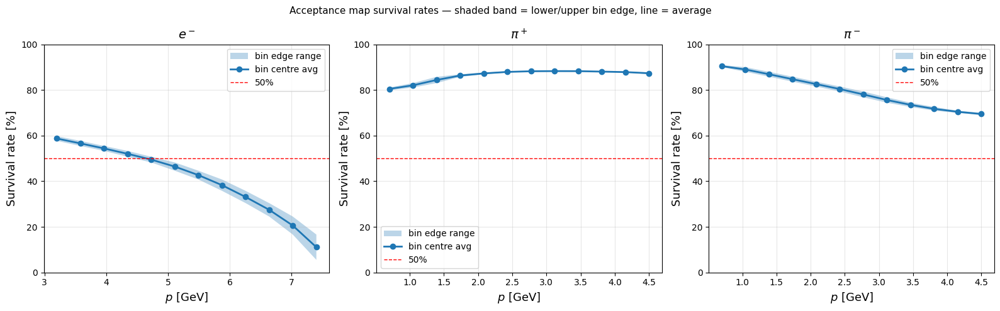


Particle    p [GeV]      Rate lo   Rate mid   Rate hi
----------------------------------------------------
$e^-$       3.20           59.8%      58.7%     57.7%
$e^-$       3.58           57.7%      56.6%     55.5%
$e^-$       3.96           55.5%      54.4%     53.3%
$e^-$       4.35           53.3%      52.0%     50.8%
$e^-$       4.73           50.8%      49.5%     48.2%
$e^-$       5.11           48.2%      46.4%     44.6%
$e^-$       5.49           44.6%      42.7%     40.8%
$e^-$       5.87           40.8%      38.3%     35.8%
$e^-$       6.25           35.8%      33.1%     30.4%
$e^-$       6.64           30.4%      27.5%     24.5%
$e^-$       7.02           24.5%      20.6%     16.6%
$e^-$       7.40           16.6%      11.1%      5.5%

$\pi^+$     0.70           79.9%      80.5%     81.1%
$\pi^+$     1.05           81.1%      82.1%     83.0%
$\pi^+$     1.39           83.0%      84.4%     85.8%
$\pi^+$     1.74           85.8%      86.3%     86.9%
$\pi^+$     2.08           

In [ ]:

# ─── Acceptance map survival rate analysis ────────────────────────────────────
# Denominator: (theta, phi) within each sector's asymptotic phi window
#              [phi_avg - a_low, phi_avg + a_up] AND [theta_min, theta_max].
# Numerator:   those that also pass the actual (theta-dependent) phi cut.
# Bin edges: survival is evaluated at p ± dp/2 and plotted as a shaded band.

MAP_FILE = "../data/acceptance_map/acceptanceMap_allE_final.root"

par_names  = ['e', 'pip', 'pim']
par_labels = [r'$e^-$', r'$\pi^+$', r'$\pi^-$']

# Dense (θ, φ) grid
N_phi, N_theta = 720, 500
phi_grid   = np.linspace(-180., 180., N_phi,   endpoint=False)
theta_grid = np.linspace(0.,    45.,  N_theta)
PHI, THETA = np.meshgrid(phi_grid, theta_grid)

# Momentum bin centres
p_grids = {
    0: np.linspace(3.2, 7.4, 12),   # electrons
    1: np.linspace(0.7, 4.5, 12),   # pi+
    2: np.linspace(0.7, 4.5, 12),   # pi-
}

param_keys = ['lower_a', 'upper_a', 'lower_b', 'upper_b', 'theta', 'max', 'mean']

inFile = ROOT.TFile.Open(MAP_FILE, "READ")

fig, axes = plt.subplots(1, 3, figsize=(16, 5))
all_results = {}

for parIdx in range(3):
    par   = par_names[parIdx]
    label = par_labels[parIdx]
    p_grid = p_grids[parIdx]
    dp     = (p_grid[1] - p_grid[0]) / 2   # half bin width

    def compute_rate(p_val):
        secs = [{key: inFile.Get(f"f_{par}_{sec+1}_param_{key};1").Eval(p_val)
                 for key in param_keys}
                for sec in range(6)]

        in_sector = np.zeros(PHI.shape, dtype=bool)
        passed    = np.zeros(PHI.shape, dtype=bool)

        for sec, sp in enumerate(secs):
            theta_min = sp['theta']
            theta_max = sp['max']
            phi_avg   = sp['mean']
            a_low, a_up = sp['lower_a'], sp['upper_a']
            b_low, b_up = sp['lower_b'], sp['upper_b']

            PHI_t = np.where(PHI < 100., PHI + 360., PHI) if (parIdx == 0 and sec == 3) else PHI

            in_theta    = (THETA > theta_min) & (THETA < theta_max)
            in_phi_asym = (PHI_t > phi_avg - a_low) & (PHI_t < phi_avg + a_up)
            in_sector  |= (in_theta & in_phi_asym)

            dt = np.where(in_theta, THETA - theta_min, 0.)

            if parIdx == 1:   # pi+ → exponential denominator
                du = np.exp(dt / b_up)
                dl = np.exp(dt / b_low)
            else:             # e, pi- → linear denominator
                du = dt / b_up
                dl = dt / b_low

            phi_max_cut = phi_avg + a_up  * (1. - 1. / (du + 1.))
            phi_min_cut = phi_avg - a_low * (1. - 1. / (dl + 1.))

            in_phi_cut = (PHI_t > phi_min_cut) & (PHI_t < phi_max_cut)
            passed    |= (in_theta & in_phi_cut)

        denom = np.sum(in_sector)
        return np.sum(passed) / denom * 100. if denom > 0 else 0.

    rates_lo  = [compute_rate(p - dp) for p in p_grid]
    rates_hi  = [compute_rate(p + dp) for p in p_grid]
    rates_mid = [(lo + hi) / 2 for lo, hi in zip(rates_lo, rates_hi)]

    all_results[parIdx] = (p_grid, rates_lo, rates_mid, rates_hi)

    ax = axes[parIdx]
    ax.fill_between(p_grid, rates_lo, rates_hi, alpha=0.3, label='bin edge range')
    ax.plot(p_grid, rates_mid, 'o-', lw=2, label='bin centre avg')
    ax.set_title(label, fontsize=14)
    ax.set_xlabel('$p$ [GeV]', fontsize=13)
    ax.set_ylabel('Survival rate [%]', fontsize=13)
    ax.set_ylim(0, 100)
    ax.grid(alpha=0.3)
    ax.axhline(50., color='red', ls='--', lw=1, label='50%')
    ax.legend()

inFile.Close()
plt.suptitle(
    r'Acceptance map survival rates — shaded band = lower/upper bin edge, line = average',
    fontsize=11)
plt.tight_layout()
plt.show()

# Summary table
print(f"\n{'Particle':<10}  {'p [GeV]':<10}  {'Rate lo':>8}  {'Rate mid':>9}  {'Rate hi':>8}")
print("-" * 52)
for parIdx, label in enumerate(par_labels):
    p_arr, r_lo, r_mid, r_hi = all_results[parIdx]
    for p_val, lo, mid, hi in zip(p_arr, r_lo, r_mid, r_hi):
        print(f"{label:<10}  {p_val:<10.2f}  {lo:>7.1f}%  {mid:>8.1f}%  {hi:>7.1f}%")
    print()
